In [1]:
#!/usr/bin/env python
# coding: utf-8

# In[1]:


# 数据下载，分割训练集测试集
import warnings

import tensorflow as tf
from tensorflow import keras
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.datasets import fetch_openml
from sklearn.exceptions import ConvergenceWarning
from sklearn.neural_network import MLPClassifier
from keras.utils import np_utils
from keras.models import Sequential
from sklearn.metrics import accuracy_score, roc_auc_score, mutual_info_score
from sklearn.preprocessing import LabelEncoder
from torchvision import datasets, transforms
import torch
import os
import pickle
from scipy.stats import levy_stable

try:
    devices = tf.config.experimental.list_physical_devices('GPU')
    print(devices)
    tf.config.experimental.set_memory_growth(devices[0], True)
    tf.config.experimental.set_memory_growth(devices[1], True)
except:
    print('未使用GPU')

# 神经网络模型搭建
from tensorflow import keras
from tensorflow.keras.layers import Dense


from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras import backend as k
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam

import multiprocessing as mp
from tqdm import tqdm

[]
未使用GPU


In [2]:
def stable_noise(img, alpha, beta, scale):
    '''
    此函数用将产生的stable噪声加到图片上
    传入:
        img   :  原图
        alpha  :  shape parameter
        beta :  symmetric parameter
        scale : scale parameter
        random_state : 随机数种子
    返回:
        stable_out : 噪声处理后的图片
        noise        : 对应的噪声
    '''
    # 产生stable noise
    noise = levy_stable.rvs(alpha=alpha,beta=beta,scale=scale,size=img.shape)
    # 将噪声和图片叠加
    stable_out = img + noise
    # 将超过 255 的置 255，低于 0 的置 0
    stable_out = np.clip(stable_out, 0, 255)
    # 取整
    stable_out = np.uint(stable_out)
    return stable_out, noise # 这里也会返回噪声，注意返回值


In [3]:
def stable_noise_mixture(img, alphas, beta, scale):
    '''
    此函数用将产生的stable噪声加到图片上。mixture：对每个像素随机加不同alpha的噪声。
    传入:
        img   :  原图
        alpha  :  shape parameter
        beta :  symmetric parameter
        scale : scale parameter
        random_state : 随机数种子
    返回:
        stable_out : 噪声处理后的图片
        noise        : 对应的噪声
    '''
    noise = np.empty_like(img)
    # 产生stable noise
    for i in range(noise.shape[0]):
        for j in range(noise.shape[1]):
            alpha_c = np.random.choice(alphas)
            noise[i,j] = levy_stable.rvs(alpha=alpha_c,beta=beta,scale=scale)
    # 将噪声和图片叠加
    stable_out = img + noise
    # 将超过 255 的置 255，低于 0 的置 0
    # stable_out = np.clip(stable_out, 0, 255)
    # 取整
    # stable_out = np.uint(stable_out)
    return stable_out, noise # 这里也会返回噪声，注意返回值
def stable_noise_mixture_hundred(inputs, alphas, beta, scale):
    '''
    此函数用将产生的stable噪声加到图片上。mixture：对每个像素随机加不同alpha的噪声。
    传入:
        img   :  原图
        alpha  :  shape parameter
        beta :  symmetric parameter
        scale : scale parameter
        random_state : 随机数种子
    返回:
        stable_out : 噪声处理后的图片
        noise        : 对应的噪声
    '''
    noisy_data = np.zeros(inputs.shape)
    num_samples = np.shape(inputs)[0]
    k = np.arange(0,num_samples,100)
    for i in k:
        temp = inputs[i:i+100]
        alpha_c = np.random.choice(alphas, size=temp.shape)
        # 产生stable noise
        noise = levy_stable.rvs(alpha=alpha_c,beta=beta,scale=scale)
        # 将噪声和图片叠加
        stable_out = temp + noise
        # 将超过 255 的置 255，低于 0 的置 0
        stable_out = np.clip(stable_out, 0, 255)
        # 取整
        stable_out = np.uint(stable_out)
        noisy_data[i:i+100] = stable_out
    return noisy_data

In [4]:
X, y = fetch_openml('mnist_784', version=1, return_X_y=True)
X_tr, X_te = X[:60000], X[60000:]
y_tr, y_te = y[:60000], y[60000:]

In [3]:
aug_times_test = 10
encoder = LabelEncoder()
sigma = 0.2
noise_scale = np.sqrt(0.5) * sigma * 255

In [ ]:
for alpha_test in [2,1.9,1.5,1.3,1,0.9,0.5]:
    X_noise_test = np.tile(X_te,(aug_times_test,1))
    X_noise_test = stable_noise(X_noise_test, alpha = alpha_test, beta=0, scale=noise_scale)[0]
    X_test = np.vstack((X_te, X_noise_test))
    X_test = X_test / 255.
    X_test = (X_test - np.mean(X_test)) / np.std(X_test)
    y_test = np.tile(y_te, aug_times_test+1)
    y_test = encoder.fit_transform(y_test)
    fw = open(f"{alpha_test}_testset_{sigma}.txt", "wb")
    pickle.dump((X_test, y_test), fw)

In [ ]:
# mixture
X_noise_test = np.tile(X_te,(aug_times_test,1))
alphas = [2, 1.9, 1.5, 1.3, 1, 0.9]
X_noise_test = stable_noise_mixture_hundred(inputs=X_noise_test, alphas=alphas, beta=0, scale=noise_scale)
X_test = np.vstack((X_te, X_noise_test))
X_test = X_test / 255.
X_test = (X_test - np.mean(X_test)) / np.std(X_test)
y_test = np.tile(y_te, aug_times_test+1)
y_test = encoder.fit_transform(y_test)
fw = open(f"mixture_testset_{sigma}.txt", "wb")
pickle.dump((X_test, y_test), fw)

In [ ]:
# multiple
X_test = X_te
# training set加噪声
for alpha_test2 in [2, 1.9, 1.5, 1.3, 1, 0.9]:
    aug_times_test2 = 2 #noise扩充倍数
    X_noise_test = np.tile(X_te,(aug_times_test2,1))
    X_noise_test = stable_noise(X_noise_test, alpha = alpha_test2, beta=0, scale=noise_scale)[0]
    # X_train = clean + noise
    X_test = np.vstack((X_test, X_noise_test))

X_test = X_test / 255.
X_test = (X_test - np.mean(X_test)) / np.std(X_test)
y_test = np.tile(y_te, aug_times_test2*6+1)
y_test = encoder.fit_transform(y_test)
fw = open(f"multiple_testset_{sigma}.txt", "wb")
pickle.dump((X_test, y_test), fw)

In [ ]:
alpha_test_list = [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 0.5, 'mixture', 'multiple']
# alpha_train_list = [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 0.5, 'mixture', 'multiple']
alpha_train_list = [0.5]
b = 64

for alpha_train in alpha_train_list:
    if alpha_train == 0:
        sigma_list = [0.1]
    else:
        # sigma_list = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
        sigma_list = [0.1, 0.2, 0.3, 0.4, 0.5]
    for sigma in sigma_list:
        print(f'sigma={sigma}')
        for depth, width in [(3, 3)]:
            print(f'depth={depth}, width={width}')
            if depth != 3:
                lr = 0.0005
                iters = 50000
            else:
                lr = 0.001
                iters = 10000
            noise_scale = np.sqrt(0.5) * sigma * 255
            model = Sequential()
            for j in range(depth-2):
                model.add(Dense(width, activation='relu',input_shape=(1,784)))
            model.add(Dense(10, activation='softmax'))
            model.compile(loss=keras.losses.categorical_crossentropy,
                                optimizer=Adam(lr=lr),
                                metrics=['accuracy'])
            ls_acc_repeat = []
            for num in range(5):
                model.load_weights('../models/mnist_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_num{}_lr{}_iter{}.h5'.format(width, depth, b, alpha_train, sigma, num, lr, iters))
                ls_acc = []
                for alpha_test in alpha_test_list:
                    print('alpha=',alpha_test)
                    if alpha_test == 0:
                        X_clean_test = X_te.copy()
                        X_clean_test = X_clean_test / 255.
                        X_clean_test = (X_clean_test - np.mean(np.asarray(X_clean_test))) / np.std(np.asarray(X_clean_test))
                        y_test = y_te
                        y_test = encoder.fit_transform(y_test)
                        # one hot encoding
                        # y_test = np_utils.to_categorical(y_test, num_classes)
                        X_clean_test = np.array(X_clean_test)
                        # y_test = np.array(y_test)
                        X_clean_test = X_clean_test.reshape(-1,1,784)
                        y_pred = model.predict(X_clean_test)
                        y_pred_label = np.argmax(y_pred, axis=2).flatten()
                        y_pred = y_pred.squeeze()
                        acc = accuracy_score(y_test, y_pred_label)
                        print(acc)
                        ls_acc.append(acc)
                    else:
                        X_test, y_test = pickle.load(open(f"{alpha_test}_testset_0.2.txt", 'rb'))
                        X_test = X_test.reshape(-1,1,784)
                        y_pred = model.predict(X_test)
                        y_pred_label = np.argmax(y_pred, axis=2).flatten()
                        y_pred = y_pred.squeeze()
                        acc = accuracy_score(y_test, y_pred_label)
                        print(acc)
                        ls_acc.append(acc)
                ls_acc_repeat.append(ls_acc)
            with open("../results/acc_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_0.2.txt".format(width,depth,b,alpha_train,sigma), "wb") as path_acc:
                pickle.dump(ls_acc_repeat, path_acc)

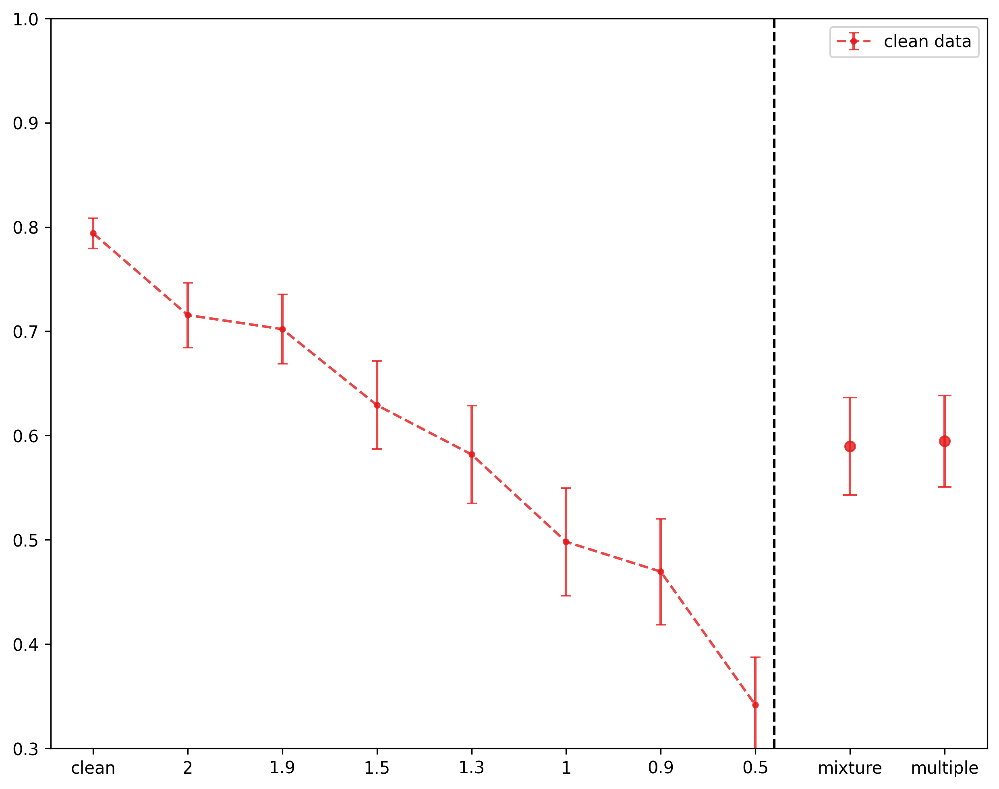

   sigma   avg_acc
0    0.1  0.619333


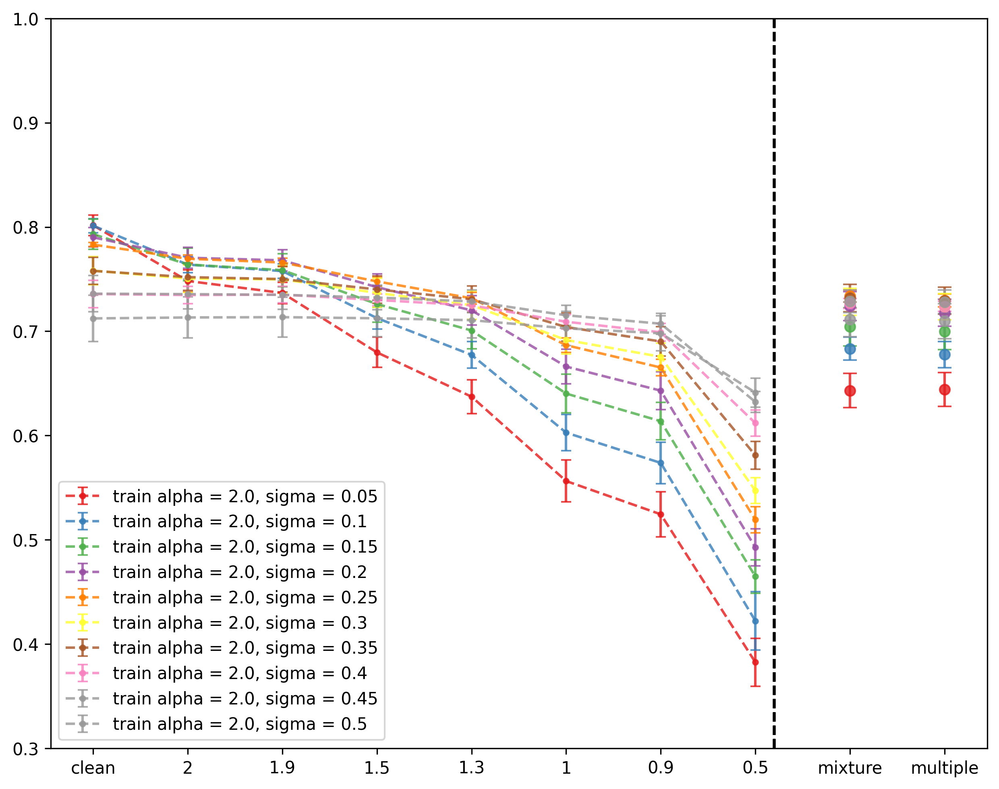

   sigma   avg_acc
4   0.25  0.734767
6   0.35  0.731767
8   0.45  0.727411
3   0.20  0.726856
5   0.30  0.726544
7   0.40  0.724333
2   0.15  0.711144
9   0.50  0.709311
1   0.10  0.694444
0   0.05  0.663478


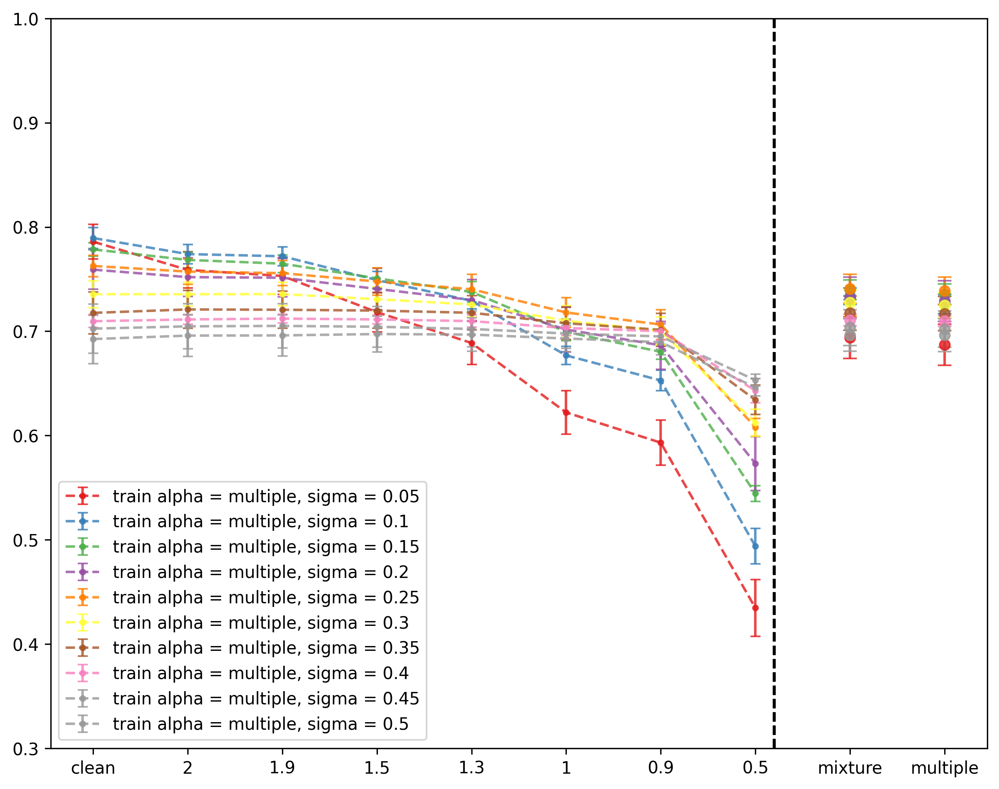

   sigma   avg_acc
4   0.25  0.740844
2   0.15  0.739433
1   0.10  0.733633
3   0.20  0.731333
5   0.30  0.725089
6   0.35  0.715544
7   0.40  0.708611
9   0.50  0.701933
0   0.05  0.700100
8   0.45  0.694833


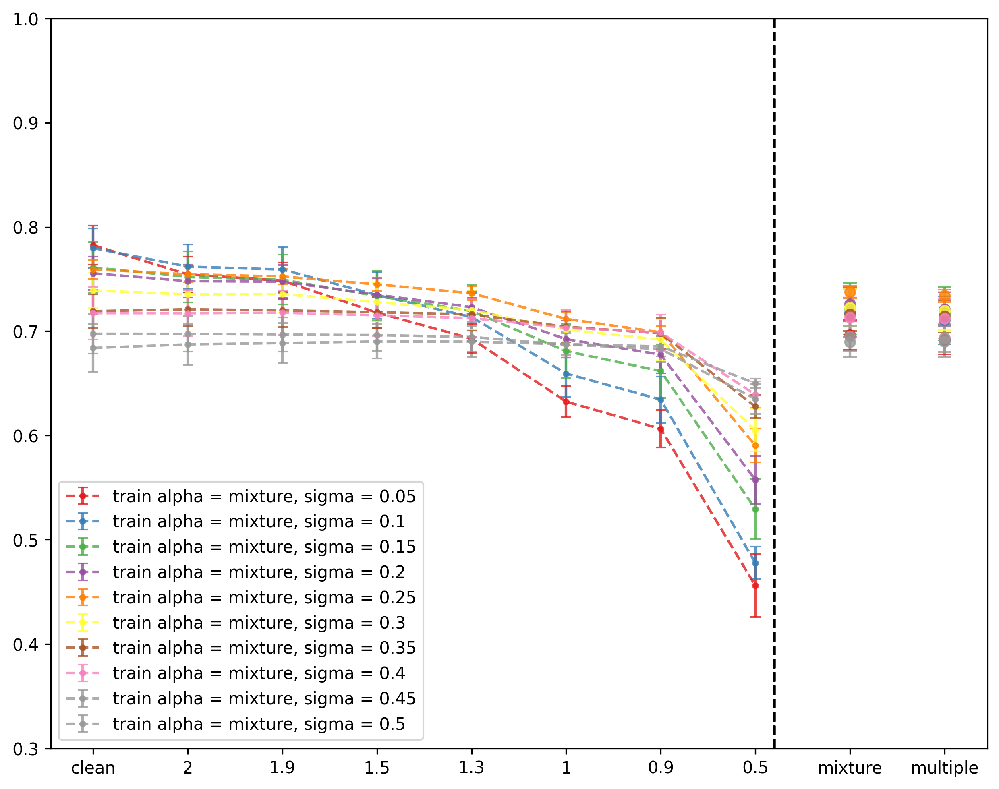

   sigma   avg_acc
4   0.25  0.736678
3   0.20  0.725122
2   0.15  0.721900
5   0.30  0.721544
1   0.10  0.719022
6   0.35  0.714189
7   0.40  0.711978
0   0.05  0.702578
8   0.45  0.693478
9   0.50  0.688144


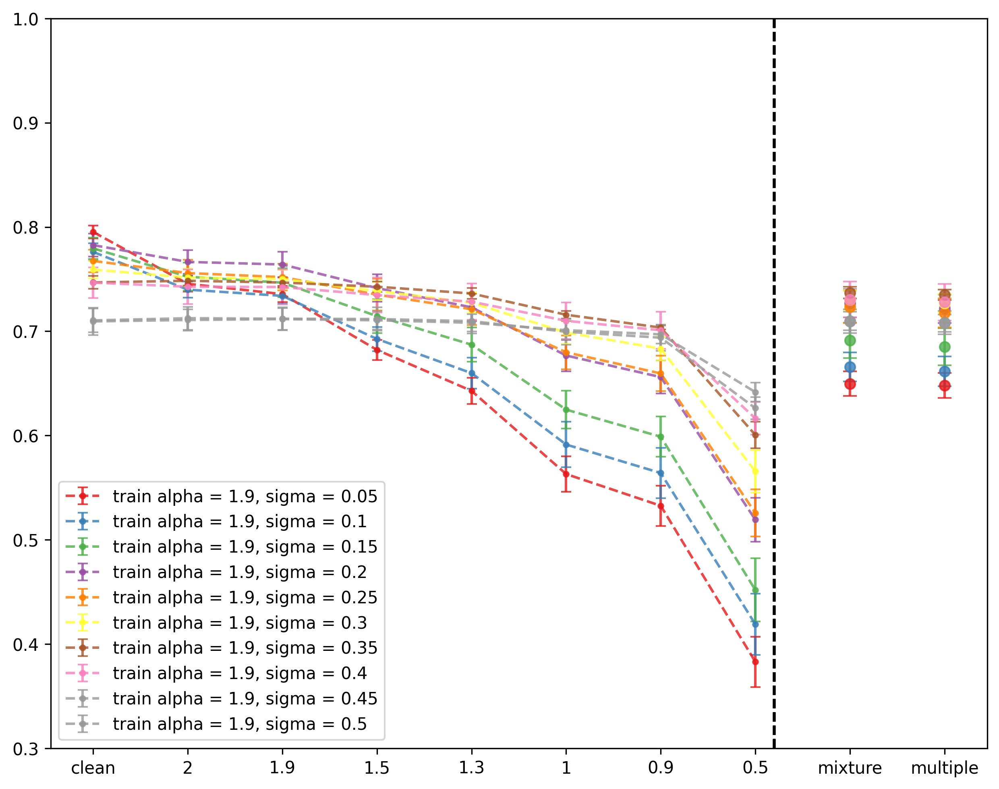

   sigma   avg_acc
6   0.35  0.734667
5   0.30  0.729533
7   0.40  0.729322
3   0.20  0.728722
4   0.25  0.723511
8   0.45  0.707489
9   0.50  0.707333
2   0.15  0.697756
1   0.10  0.676100
0   0.05  0.666056


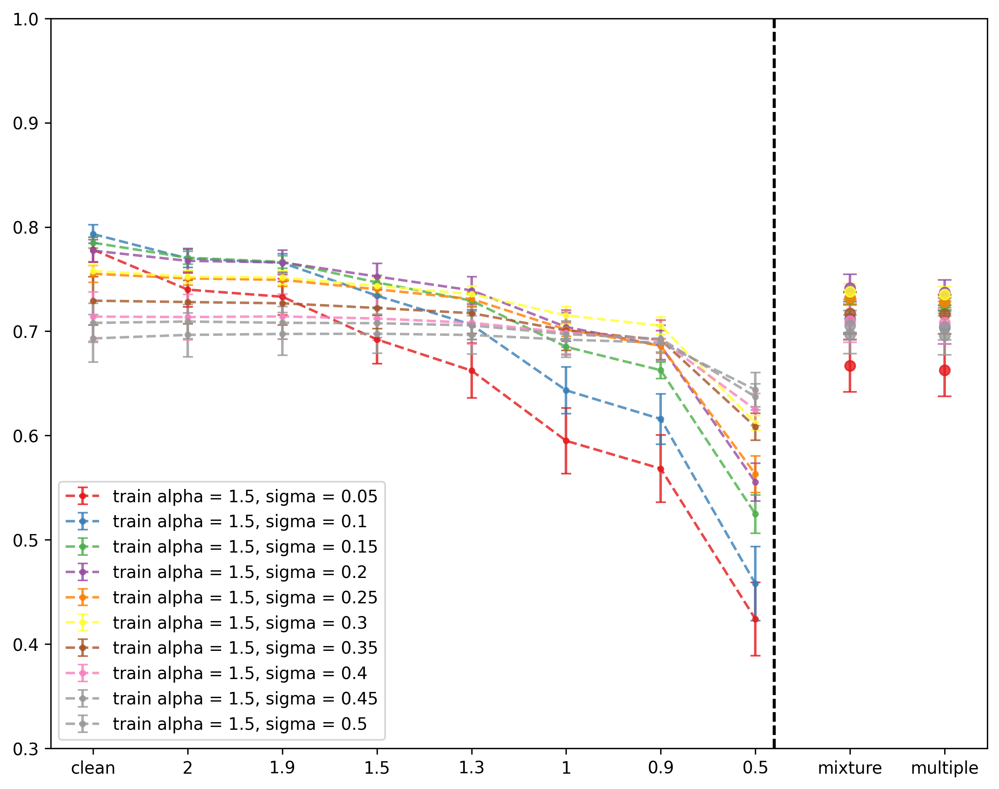

   sigma   avg_acc
3   0.20  0.741267
5   0.30  0.737189
2   0.15  0.733689
4   0.25  0.730467
6   0.35  0.716633
1   0.10  0.715989
7   0.40  0.707856
8   0.45  0.704311
9   0.50  0.695011
0   0.05  0.677578


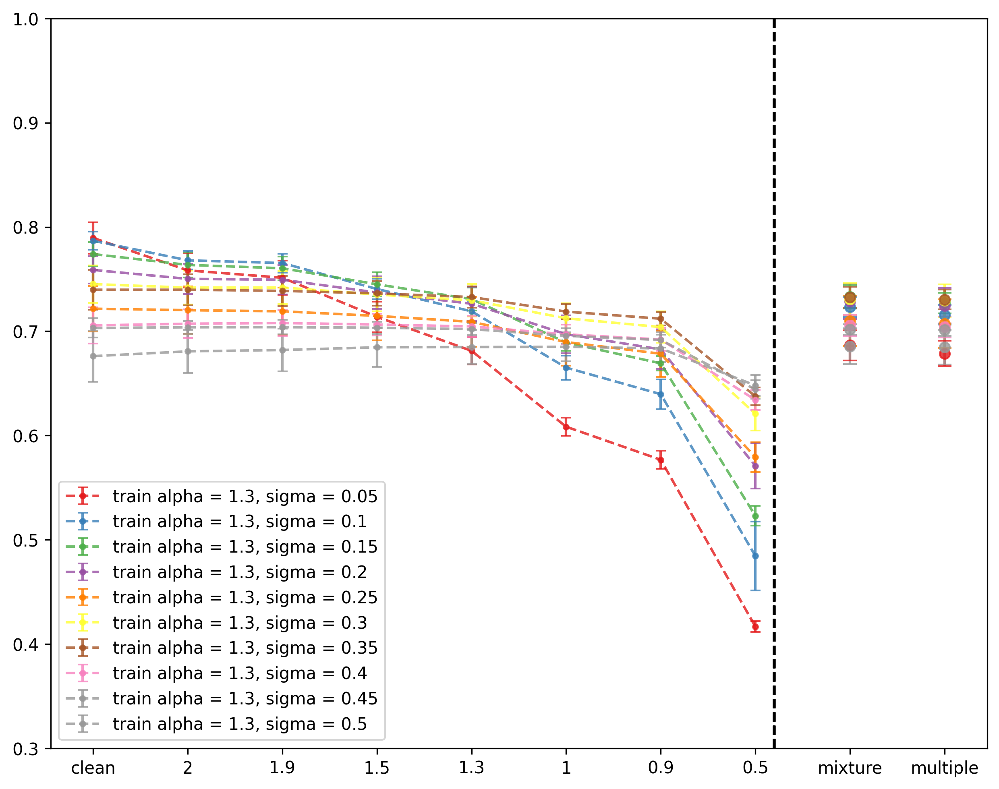

   sigma   avg_acc
2   0.15  0.732467
6   0.35  0.731256
5   0.30  0.730044
3   0.20  0.728300
1   0.10  0.724844
4   0.25  0.707744
7   0.40  0.703389
8   0.45  0.700711
0   0.05  0.693844
9   0.50  0.683022


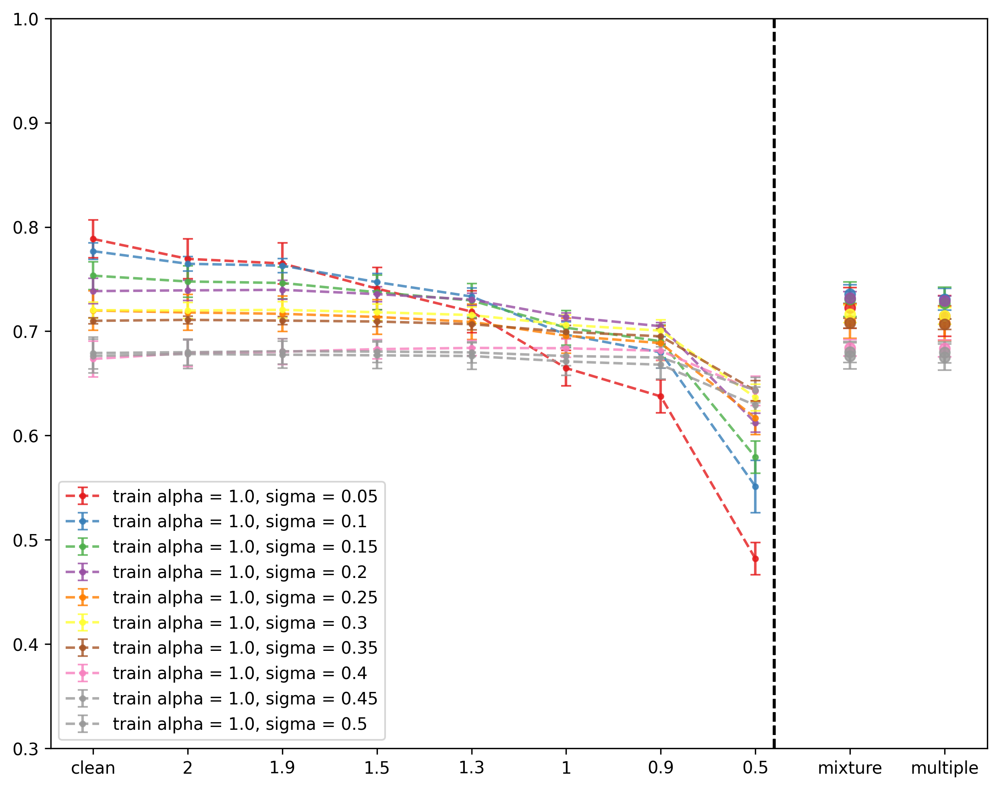

   sigma   avg_acc
1   0.10  0.736400
2   0.15  0.729489
3   0.20  0.729233
0   0.05  0.724633
5   0.30  0.714689
4   0.25  0.708789
6   0.35  0.706244
7   0.40  0.681356
9   0.50  0.679000
8   0.45  0.675044


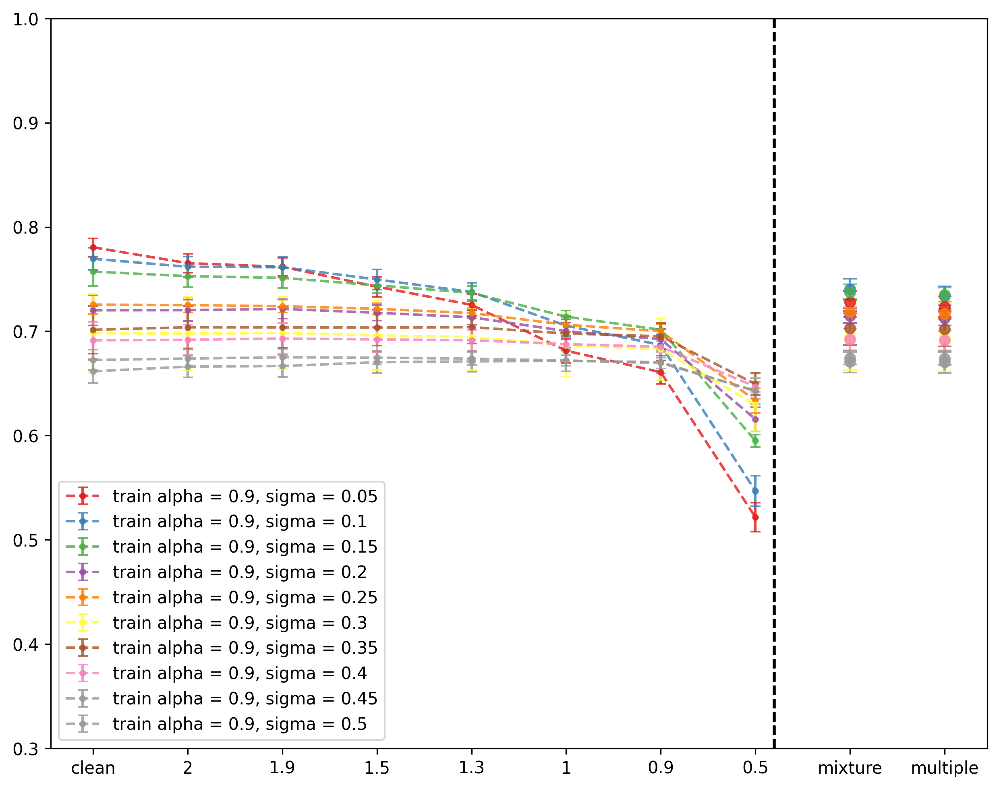

   sigma   avg_acc
1   0.10  0.738489
2   0.15  0.736644
0   0.05  0.729878
4   0.25  0.717189
3   0.20  0.712522
6   0.35  0.701589
5   0.30  0.693711
7   0.40  0.690600
9   0.50  0.673200
8   0.45  0.668744


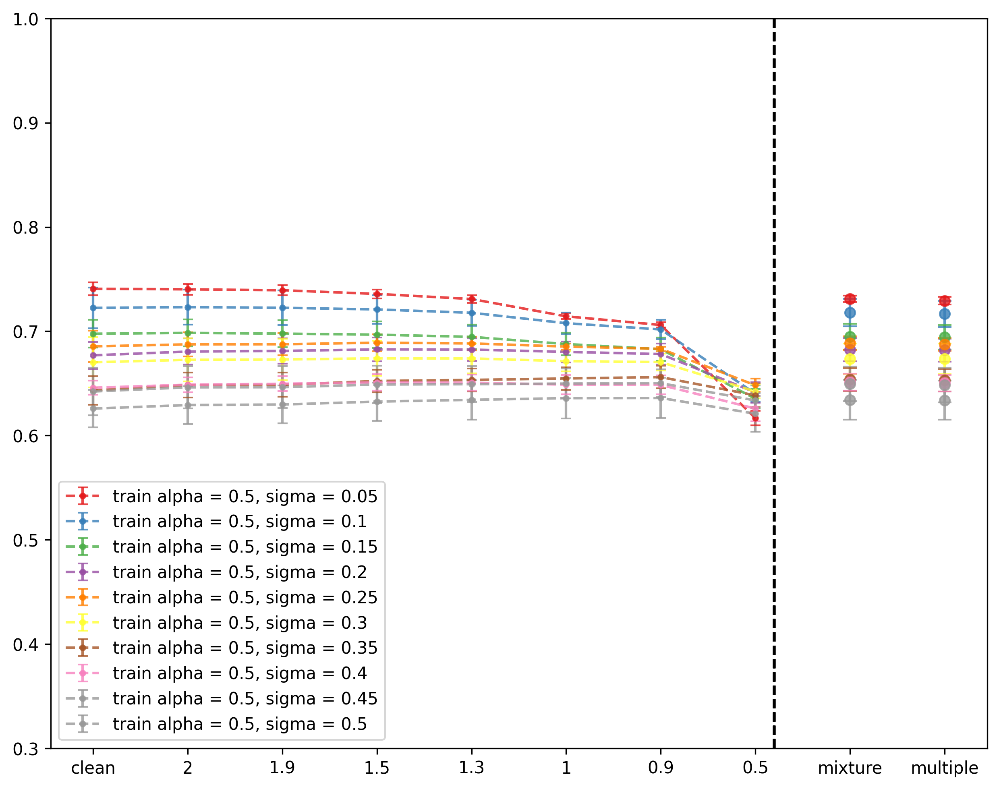

   sigma   avg_acc
0   0.05  0.729722
1   0.10  0.716711
2   0.15  0.693822
4   0.25  0.686900
3   0.20  0.680667
5   0.30  0.672500
6   0.35  0.651467
7   0.40  0.649367
8   0.45  0.647856
9   0.50  0.632356


In [6]:
from matplotlib import pyplot
depth, width = 3, 3

# plt.figure(dpi=300)
alphas = [0.0, 2.0,'multiple','mixture',1.9,1.5,1.3,1.0,0.9,0.5]
palette = pyplot.get_cmap('Set1')
opt_sigma = dict()
for alpha in alphas:
    i=0
    plt.figure(figsize=(10, 8),dpi=300)
    # if alpha != 'multiple' and alpha != 'mixture':
    #     alpha = float(alpha)
# for alpha in [1.9]:
    color=palette(i)
    if i == 9:
        color = '#00FFFF'
    if i == 10:
        color = 'black'
    if i == 11:
        color='fuchsia'
    if alpha == 0:
        sigma_list = [0.1]
    else:
        sigma_list = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
    mean_list = []
    
    for sigma in sigma_list:
        color=palette(i)
        acc_path = f"../results/acc_FCN_width{width}_depth{depth}_b64_alpha{alpha}_sigma{sigma}_0.2.txt"
        if os.path.exists(acc_path) == 0:
            print('no exists,', acc_path)
            continue
        f = open(acc_path, 'rb')
        try:
            acc = pickle.load(f)
        except:
            print("the file is empty, alpha={}".format(alpha))
            continue
        df = pd.DataFrame(acc)
        npdf = np.array(df)
        means = np.array(npdf.mean(axis=0).round(decimals=4))
        stds = np.array(npdf.std(axis=0).round(decimals=4))
        mean_list.append(np.mean(np.concatenate([means[:-3], means[-2:]])))
        x = ['mixture','multiple','clean','2', '1.9', '1.5', '1.3', '1', '0.9', '0.5']
        if alpha == 0:
            labels = 'clean data'
        else:
            labels = 'train alpha = {}, sigma = {}'.format(alpha, sigma)
        plt.errorbar(x[2:],means[:-2],yerr=stds[:-2],capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
        plt.axvline(x.index('0.5')-2+0.2,linestyle='--',color='black')
        plt.errorbar(x[:2],means[-2:],yerr = stds[-2:],fmt='o',capsize=4,alpha=0.8,color = color)
        i=i+1
        plt.ylim(0.3,1)
    if os.path.exists(acc_path) == 0:
        continue
    plt.legend()
    plt.show()
    tmp = pd.DataFrame({'sigma': sigma_list, 'avg_acc': mean_list})
    tmp = tmp.sort_values('avg_acc', ascending=False)
    print(tmp)
    opt_sigma[alpha] = tmp['sigma'].iloc[0]

In [7]:
opt_sigma

{0.0: 0.1,
 2.0: 0.25,
 'multiple': 0.25,
 'mixture': 0.25,
 1.9: 0.35,
 1.5: 0.2,
 1.3: 0.15,
 1.0: 0.1,
 0.9: 0.1,
 0.5: 0.05}

3 3


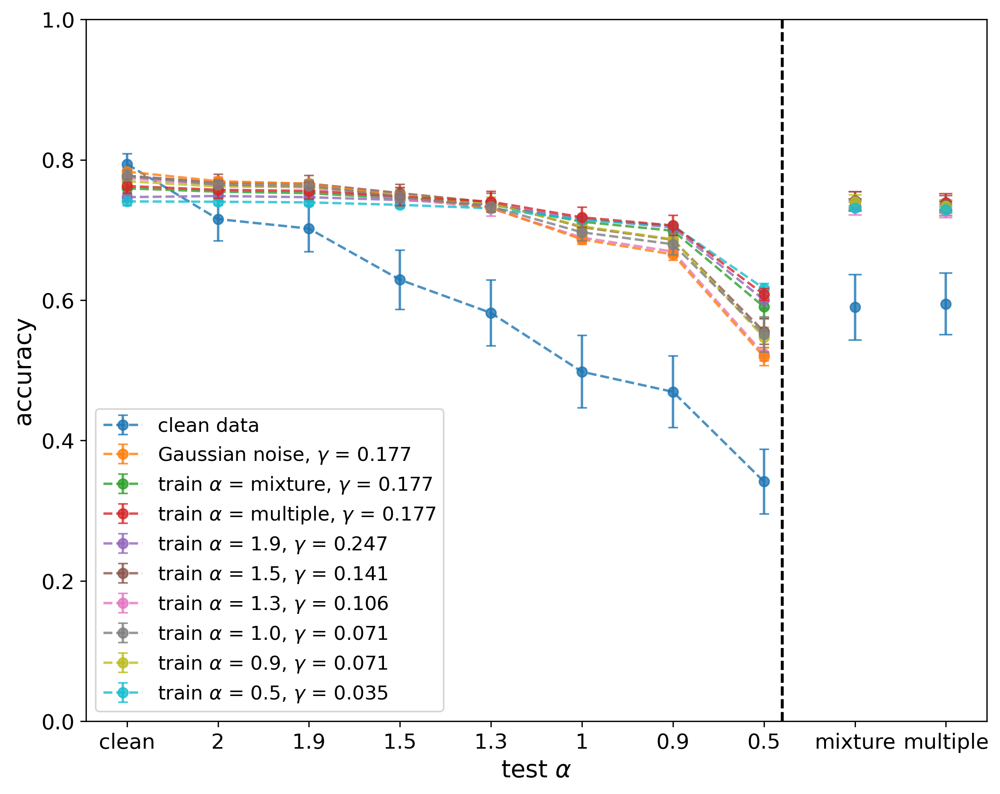

3 10


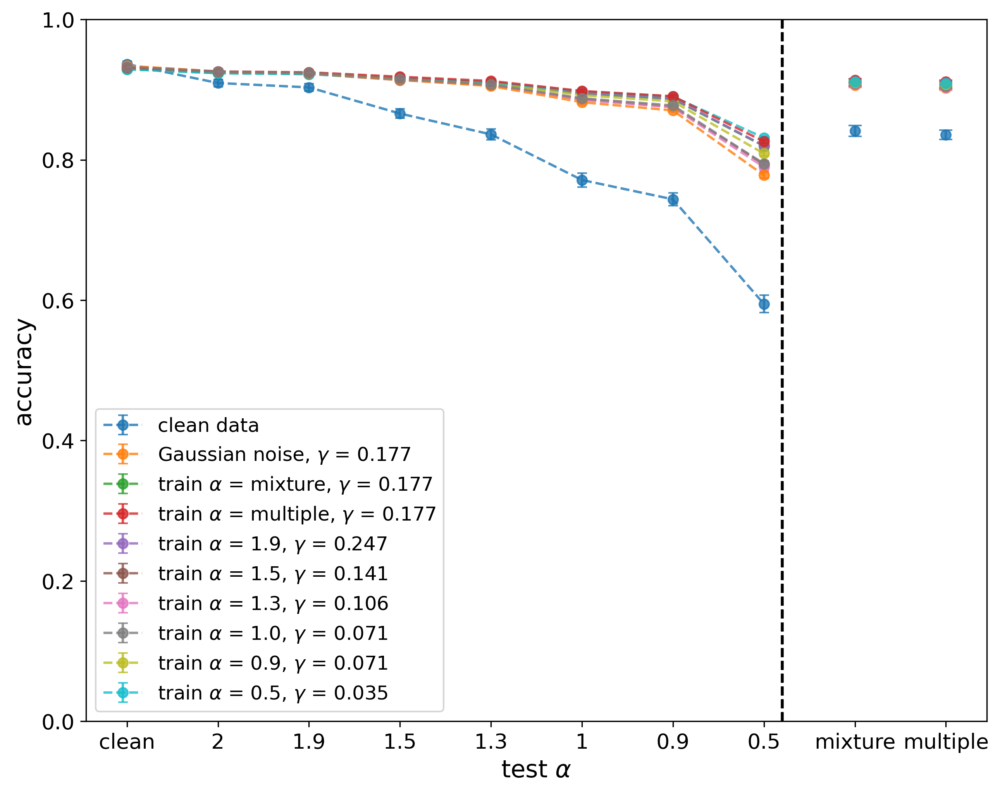

3 100


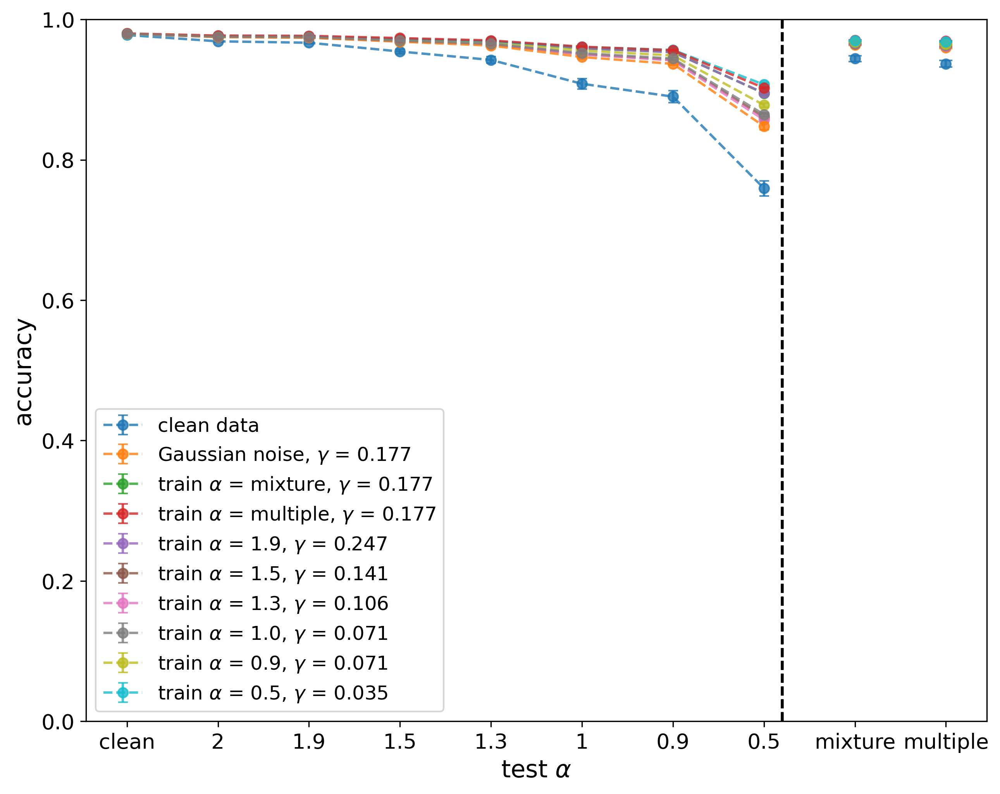

4 3


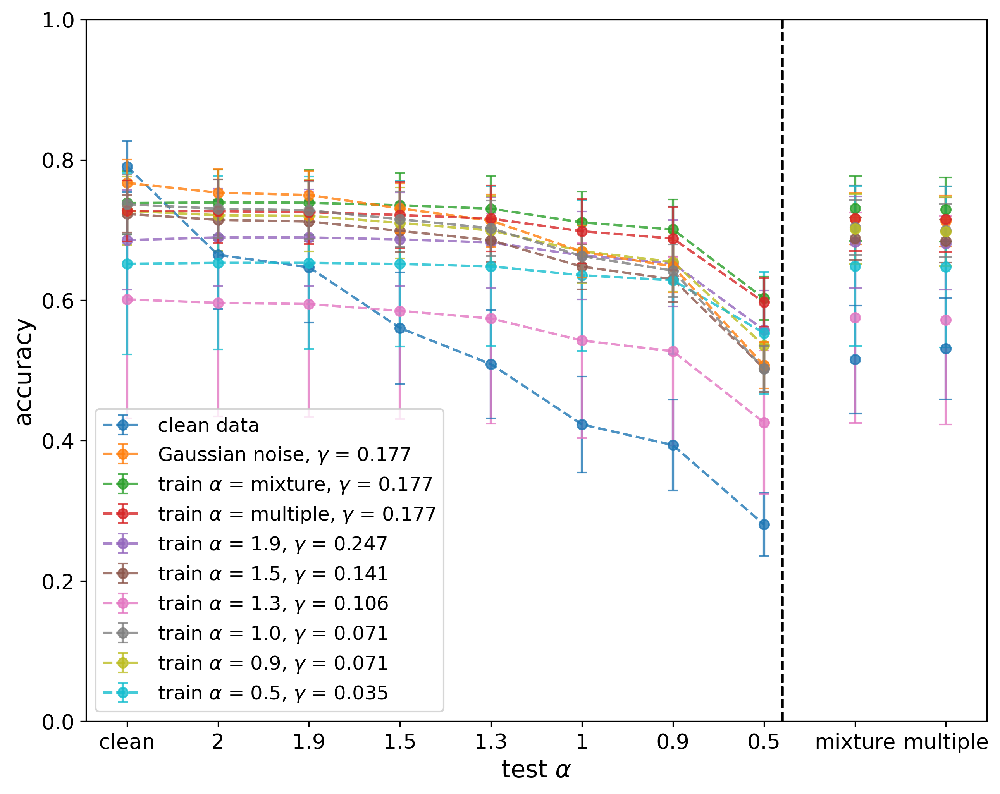

5 3


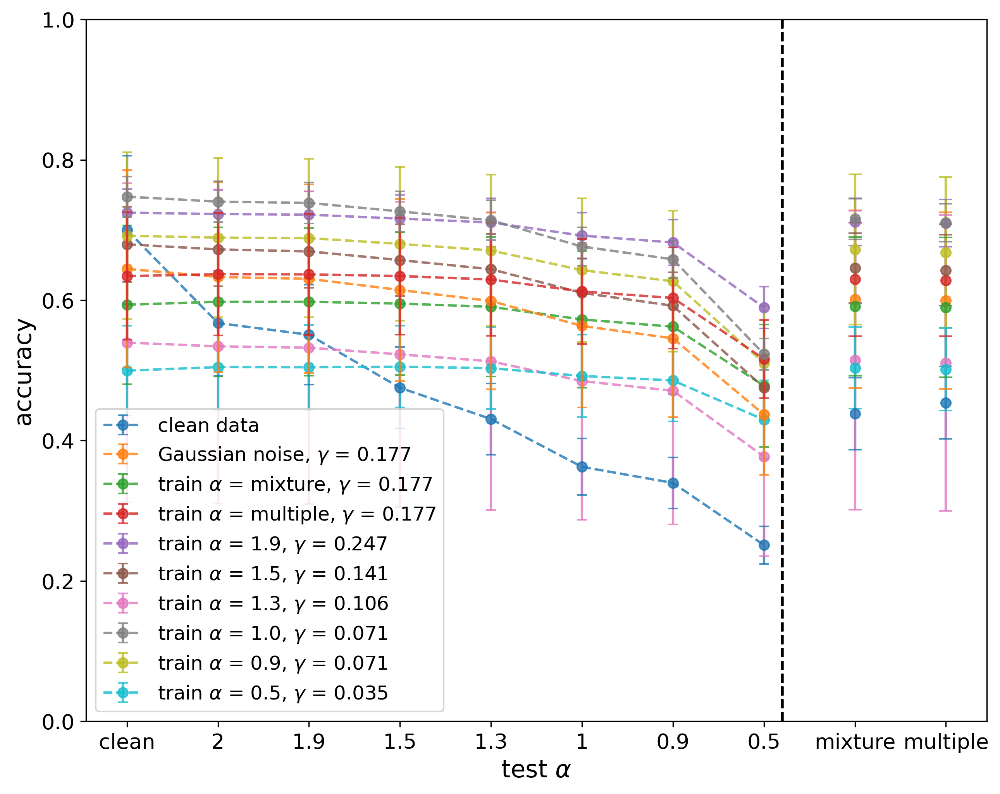

In [6]:
from matplotlib import pyplot
import seaborn as sns
for depth, width in [(3, 3), (3, 10), (3, 100), (4, 3), (5, 3)]:
    print(depth, width)
    colors = sns.color_palette(n_colors = 10)
    # acc
    # plt.figure(dpi=300)
    alphas = [0.0,2.0,'mixture','multiple',1.9,1.5,1.3,1.0,0.9,0.5]
    plt.figure(figsize=(10, 8),dpi=300)
    i = 0
    for alpha in alphas:
        # if alpha != 'multiple' and alpha != 'mixture':
        #     alpha = float(alpha)
    # for alpha in [1.9]:
        color=colors[i]
        sigma = opt_sigma[alpha]
        mean_list = []
        acc_path = f"../results/acc_FCN_width{width}_depth{depth}_b64_alpha{alpha}_sigma{sigma}_0.2.txt"
        if os.path.exists(acc_path) == 0:
            print('no exists,', acc_path)
            continue
        f = open(acc_path, 'rb')
        try:
            acc = pickle.load(f)
        except:
            print("the file is empty, alpha={}".format(alpha))
            continue
        df = pd.DataFrame(acc)
        npdf = np.array(df)
        means = np.array(npdf.mean(axis=0).round(decimals=4))
        stds = np.array(npdf.std(axis=0).round(decimals=4))
        mean_list.append(np.mean(means))
        x = ['mixture','multiple','clean','2', '1.9', '1.5', '1.3', '1', '0.9', '0.5']
        gamma = np.sqrt(1/2) * sigma
        if alpha == 0:
            labels = 'clean data'
            zorder = 1
        elif alpha == 2:
            labels = 'Gaussian noise, $\gamma$ = {:.3f}'.format(gamma)
            zorder = 2
        else:
            labels = 'train $\\alpha$ = {}, $\gamma$ = {:.3f}'.format(alpha, gamma)
            if alpha == "multiple" or alpha == 1:
                zorder = 3
            else:
                zorder = 1
        plt.errorbar(x[2:],means[:-2],yerr=stds[:-2],capsize=3,fmt='--o',alpha=0.8,color = color,label =labels, zorder=zorder)
        plt.axvline(x.index('0.5')-2+0.2,linestyle='--',color='black')
        plt.errorbar(x[:2],means[-2:],yerr = stds[-2:],fmt='o',capsize=4,alpha=0.8,color = color)
        i=i+1
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.ylim(0,1)
    plt.legend(loc=0,fontsize=12)#图例
    plt.xlabel("test $\\alpha$",fontsize=15)#横坐标名字
    plt.ylabel("accuracy",fontsize=15)#纵坐标名字
    if not os.path.exists('./figure'):
            os.makedirs('./figure')
    plt.savefig(f'./figure/mnist_{width}_{depth}.png',bbox_inches='tight')
    plt.show()

3 3


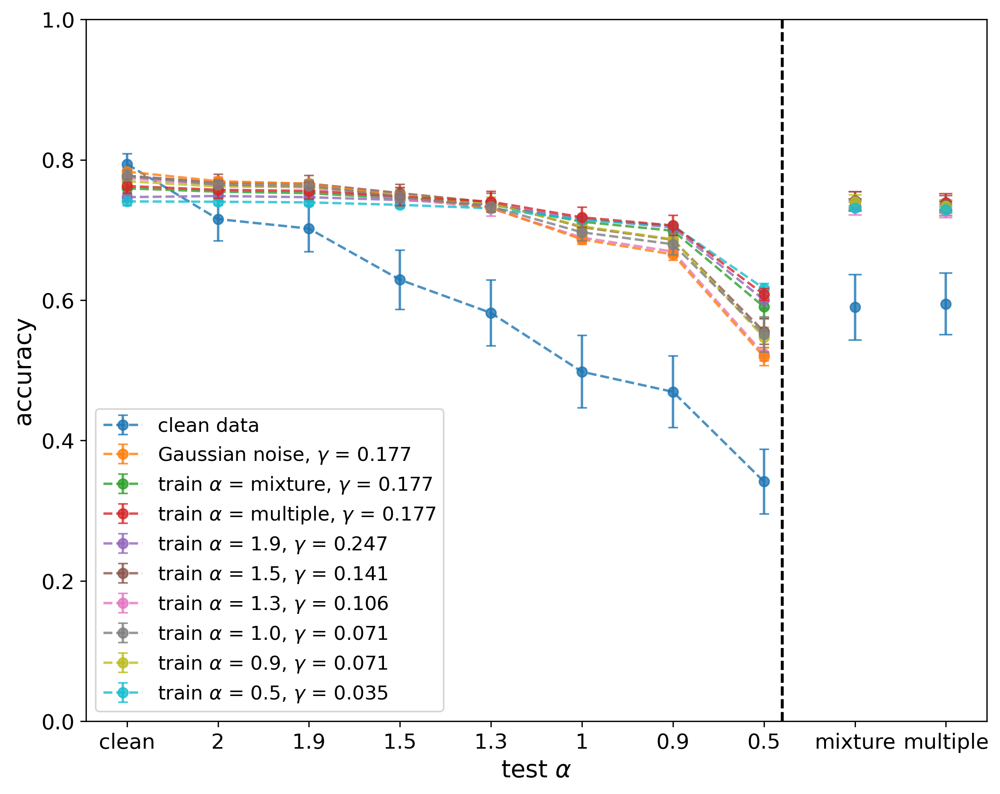

In [16]:
from matplotlib import pyplot
import seaborn as sns
# for depth, width in [(3, 3), (3, 10), (3, 100), (4, 3), (5, 3)]:
for depth, width in [(3, 3)]:
    print(depth, width)
    colors = sns.color_palette(n_colors = 10)
    # acc
    # plt.figure(dpi=300)
    alphas = [0.0,2.0,'mixture','multiple',1.9,1.5,1.3,1.0,0.9,0.5]
    plt.figure(figsize=(10, 8),dpi=300)
    i = 0
    mean_list = []
    for alpha in alphas:
        # if alpha != 'multiple' and alpha != 'mixture':
        #     alpha = float(alpha)
    # for alpha in [1.9]:
        color=colors[i]
        sigma = opt_sigma[alpha]
        acc_path = f"../results/acc_FCN_width{width}_depth{depth}_b64_alpha{alpha}_sigma{sigma}_0.2.txt"
        if os.path.exists(acc_path) == 0:
            print('no exists,', acc_path)
            continue
        f = open(acc_path, 'rb')
        try:
            acc = pickle.load(f)
        except:
            print("the file is empty, alpha={}".format(alpha))
            continue
        df = pd.DataFrame(acc)
        npdf = np.array(df)
        means = np.array(npdf.mean(axis=0).round(decimals=4))
        stds = np.array(npdf.std(axis=0).round(decimals=4))
        mean_list.append(means[:-2])
        x = ['mixture','multiple','clean','2', '1.9', '1.5', '1.3', '1', '0.9', '0.5']
        gamma = np.sqrt(1/2) * sigma
        if alpha == 0:
            labels = 'clean data'
            zorder = 1
        elif alpha == 2:
            labels = 'Gaussian noise, $\gamma$ = {:.3f}'.format(gamma)
            zorder = 2
        else:
            labels = 'train $\\alpha$ = {}, $\gamma$ = {:.3f}'.format(alpha, gamma)
            if alpha == "multiple" or alpha == 1:
                zorder = 3
            else:
                zorder = 1
        plt.errorbar(x[2:],means[:-2],yerr=stds[:-2],capsize=3,fmt='--o',alpha=0.8,color = color,label =labels, zorder=zorder)
        plt.axvline(x.index('0.5')-2+0.2,linestyle='--',color='black')
        plt.errorbar(x[:2],means[-2:],yerr = stds[-2:],fmt='o',capsize=4,alpha=0.8,color = color)
        i=i+1
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.ylim(0,1)
    plt.legend(loc=0,fontsize=12)#图例
    plt.xlabel("test $\\alpha$",fontsize=15)#横坐标名字
    plt.ylabel("accuracy",fontsize=15)#纵坐标名字
    if not os.path.exists('./figure'):
            os.makedirs('./figure')
    plt.savefig(f'./figure/mnist_{width}_{depth}.png',bbox_inches='tight')
    plt.show()

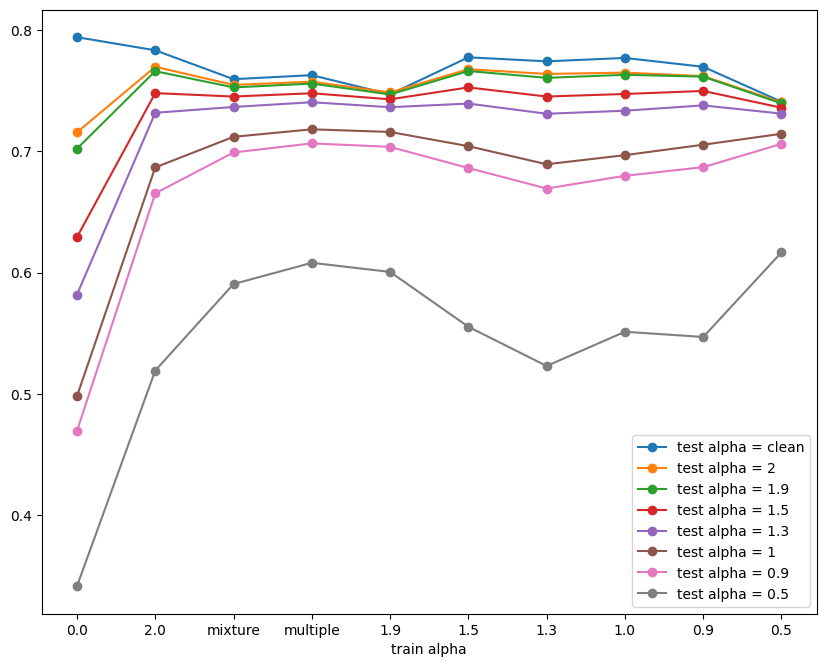

In [32]:
plt.figure(figsize=(10, 8),dpi=100)
plt.plot(np.asarray(mean_list), '-o')
plt.xticks(range(len(alphas)), alphas)
plt.legend(['test alpha = '+ a for a in ['clean','2', '1.9', '1.5', '1.3', '1', '0.9', '0.5']])
plt.xlabel('train alpha')
plt.show()

In [6]:
from matplotlib import pyplot
import seaborn as sns
depth, width = 3, 3
colors = sns.color_palette(n_colors = 10)
# acc
# plt.figure(dpi=300)
alphas = [0.0,2.0,'mixture','multiple',1.9,1.5,1.3,1.0,0.9,0.5]
plt.figure(figsize=(10, 8),dpi=300)
i = 0
alphaToacc = dict()
for alpha in alphas:
    # if alpha != 'multiple' and alpha != 'mixture':
    #     alpha = float(alpha)
# for alpha in [1.9]:
    color=colors[i]
    sigma = opt_sigma[alpha]
    acc_path = f"../results/acc_FCN_width{width}_depth{depth}_b64_alpha{alpha}_sigma{sigma}_0.2.txt"
    if os.path.exists(acc_path) == 0:
        print('no exists,', acc_path)
        continue
    f = open(acc_path, 'rb')
    try:
        acc = pickle.load(f)
    except:
        print("the file is empty, alpha={}".format(alpha))
        continue
    df = pd.DataFrame(acc)
    npdf = np.array(df)
    means = np.array(npdf.mean(axis=0).round(decimals=4))
    stds = np.array(npdf.std(axis=0).round(decimals=4))
    alphaToacc[alpha] = np.mean(means)

<Figure size 3000x2400 with 0 Axes>

In [7]:
alphaToacc

{0.0: 0.59155,
 2.0: 0.71321,
 'mixture': 0.7220600000000001,
 'multiple': 0.72756,
 1.9: 0.7212500000000002,
 1.5: 0.7226699999999999,
 1.3: 0.7115199999999999,
 1.0: 0.71788,
 0.9: 0.71933,
 0.5: 0.71841}

In [8]:
for i in [1.0, 0.9, 'multiple']:
    print(i)
    print('比clean', alphaToacc[i] / alphaToacc[0.0] - 1)
    print('比Gaussian', alphaToacc[i] / alphaToacc[2.0] - 1)

1.0
比clean 0.21355760290761538
比Gaussian 0.006547861078784578
0.9
比clean 0.21600879046572574
比Gaussian 0.008580922869841912
multiple
比clean 0.22992139295072267
比Gaussian 0.020120301173567334


test on assymetric case

In [17]:
def stable_noise2(img, alpha, beta, scale):
    '''
    此函数用将产生的stable噪声加到图片上
    传入:
        img   :  原图
        alpha  :  shape parameter
        beta :  symmetric parameter
        scale : scale parameter
        random_state : 随机数种子
    返回:
        stable_out : 噪声处理后的图片
        noise        : 对应的噪声
    '''
    # 产生stable noise
    noise = levy_stable.rvs(alpha=alpha,beta=beta,scale=scale,size=img.shape)
    # 将噪声和图片叠加
    stable_out = img + noise
    # 将超过 255 的置 255，低于 0 的置 0
    stable_out = np.clip(stable_out, 0, 255)
    # 取整
    stable_out = np.uint(stable_out)
    return stable_out

In [6]:
aug_times_test = 10
encoder = LabelEncoder()
sigma = 0.2
noise_scale = np.sqrt(0.5) * sigma * 255

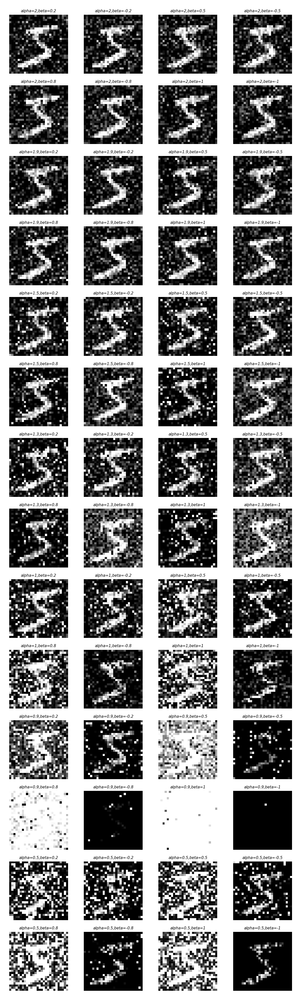

In [22]:
import matplotlib.image as mping
# 以第一张图片为例画一下加stable噪声的效果
# 读取图片
src = np.asarray(X[0]).reshape(28,28)

# 创建绘图 figure
fig_out = plt.figure(figsize=(4, 14), dpi=370) # figsize宽高比

ax = 1  #ax：第ax张子图
for alpha_test in [2,1.9,1.5,1.3,1,0.9,0.5]:
    for beta in [0.2, -0.2, 0.5, -0.5, 0.8, -0.8, 1, -1]:
        # 将图片和不同的噪声叠加
        noisy_out = stable_noise2(src, alpha_test, beta, noise_scale)
        # 创建 AxesSubplot 对象
        ax_out = fig_out.add_subplot(14,4,ax)    #3*7的画布，第ax张子图
        # 将丑兮兮的坐标抽去掉
        ax_out.axis('off')
        # 设置标题
        ax_out.set_title(f'alpha={alpha_test},beta={beta}', loc='center', fontsize=3, fontstyle='italic',pad=2)  #pad:标题与图片的距离
        # 图片展示
        ax_out.imshow(noisy_out, cmap='gray')
        ax += 1

# 图片显示
plt.show()


In [ ]:
for alpha_test in [2,1.9,1.5,1.3,1,0.9,0.5]:
    for beta in [0.2, -0.2, 0.5, -0.5, 0.8, -0.8, 1, -1]:
        if os.path.exists(f"testset/assymetric/alpha{alpha_test}_beta{beta}_testset_{sigma}.txt"):
            continue
        X_noise_test = np.tile(X_te,(aug_times_test,1))
        pool = mp.Pool(max(int(mp.cpu_count()/2), 16))  # 创建进程池，使用CPU核心数/2作为进程数
        res = [pool.apply_async(stable_noise2, args=(img, alpha_test, beta, noise_scale)) for img in X_noise_test]
        noisy = []
        for p in tqdm(res):
            noisy.append(p.get())
        pool.close()  # 关闭进程池
        pool.join()  # 等待所有子进程完成
        X_noise_test = np.asarray(noisy)
        X_test = np.vstack((X_te, X_noise_test))
        X_test = X_test / 255.
        X_test = (X_test - np.mean(X_test)) / np.std(X_test)
        y_test = np.tile(y_te, aug_times_test+1)
        y_test = encoder.fit_transform(y_test)
        fw = open(f"testset/assymetric/alpha{alpha_test}_beta{beta}_testset_{sigma}.txt", "wb")
        pickle.dump((X_test, y_test), fw)

In [39]:
# test acc
b = 64
alpha_train_list = [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 0.5, 'mixture', 'multiple']
alpha_test_list = [2,1.9,1.5,1.3,1,0.9,0.5]
beta_list = [0.2, -0.2, 0.5, -0.5, 0.8, -0.8, 1, -1]
opt_sigma = {0.0: 0.1,
 2.0: 0.25,
 'multiple': 0.25,
 'mixture': 0.25,
 1.9: 0.35,
 1.5: 0.2,
 1.3: 0.15,
 1.0: 0.1,
 0.9: 0.1,
 0.5: 0.05}
for alpha_train in alpha_train_list:
    save_path = "../results/acc_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_testonassymetric.txt".format(width,depth,b,alpha_train,sigma)
    sigma_train = opt_sigma[alpha_train]
    print(f'sigma={sigma}')
    for depth, width in [(3, 3)]:
        if os.path.exists(save_path):
            print(save_path, 'exists!')
            continue
        print(f'depth={depth}, width={width}')
        if depth != 3:
            lr = 0.0005
            iters = 50000
        else:
            lr = 0.001
            iters = 10000
        model = Sequential()
        for j in range(depth-2):
            model.add(Dense(width, activation='relu',input_shape=(1,784)))
        model.add(Dense(10, activation='softmax'))
        model.compile(loss=keras.losses.categorical_crossentropy,
                            optimizer=Adam(lr=lr),
                            metrics=['accuracy'])
        ls_acc_repeat = []
        for num in range(5):
            model.load_weights('../models/mnist_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_num{}_lr{}_iter{}.h5'.format(width, depth, b, alpha_train, sigma_train, num, lr, iters))
            ls_acc = []
            for alpha_test in alpha_test_list:
                for beta in beta_list:
                    print('alpha_test=',alpha_test,'beta=',beta)
                    X_test, y_test = pickle.load(open(f"./testset/assymetric/alpha{alpha_test}_beta{beta}_testset_{sigma}.txt", 'rb'))
                    X_test = X_test.reshape(-1,1,784)
                    y_pred = model.predict(X_test)
                    y_pred_label = np.argmax(y_pred, axis=2).flatten()
                    y_pred = y_pred.squeeze()
                    acc = accuracy_score(y_test, y_pred_label)
                    print(acc)
                    ls_acc.append(acc)
            ls_acc_repeat.append(ls_acc)
        with open(save_path, "wb") as path_acc:
            pickle.dump(ls_acc_repeat, path_acc)

sigma=0.2
depth=3, width=3
alpha_test= 2 beta= 0.2
0.6835454545454546
alpha_test= 2 beta= -0.2
0.6823363636363636
alpha_test= 2 beta= 0.5
0.6827272727272727
alpha_test= 2 beta= -0.5
0.6823181818181818
alpha_test= 2 beta= 0.8


In [20]:
alpha_test_list = [2,1.9,1.5,1.3,1,0.9,0.5]
beta_list = [0.2, -0.2, 0.5, -0.5, 0.8, -0.8, 1, -1]

In [4]:
from matplotlib import pyplot
depth, width = 3, 3
opt_sigma = {0.0: 0.1,
 2.0: 0.25,
 'multiple': 0.25,
 'mixture': 0.25,
 1.9: 0.35,
 1.5: 0.2,
 1.3: 0.15,
 1.0: 0.1,
 0.9: 0.1,
 0.5: 0.05}
# plt.figure(dpi=300)
alphas = [0.0,2.0,'multiple','mixture',1.9,1.5,1.3,1.0,0.9,0.5]
palette = pyplot.get_cmap('Set1')
mean_list = []
std_list = []
for alpha in alphas:
    sigma = opt_sigma[alpha]
    
    acc_path = f"../results/acc_FCN_width{width}_depth{depth}_b64_alpha{alpha}_sigma0.2_testonassymetric.txt"
    if os.path.exists(acc_path) == 0:
        print('no exists,', acc_path)
        continue
    f = open(acc_path, 'rb')
    try:
        acc = pickle.load(f)
    except:
        print("the file is empty, alpha={}".format(alpha))
        continue
    df = pd.DataFrame(acc)
    npdf = np.array(df)
    means = np.array(npdf.mean(axis=0).round(decimals=4))
    stds = np.array(npdf.std(axis=0).round(decimals=4))
    mean_list.append(means)
    std_list.append(stds)

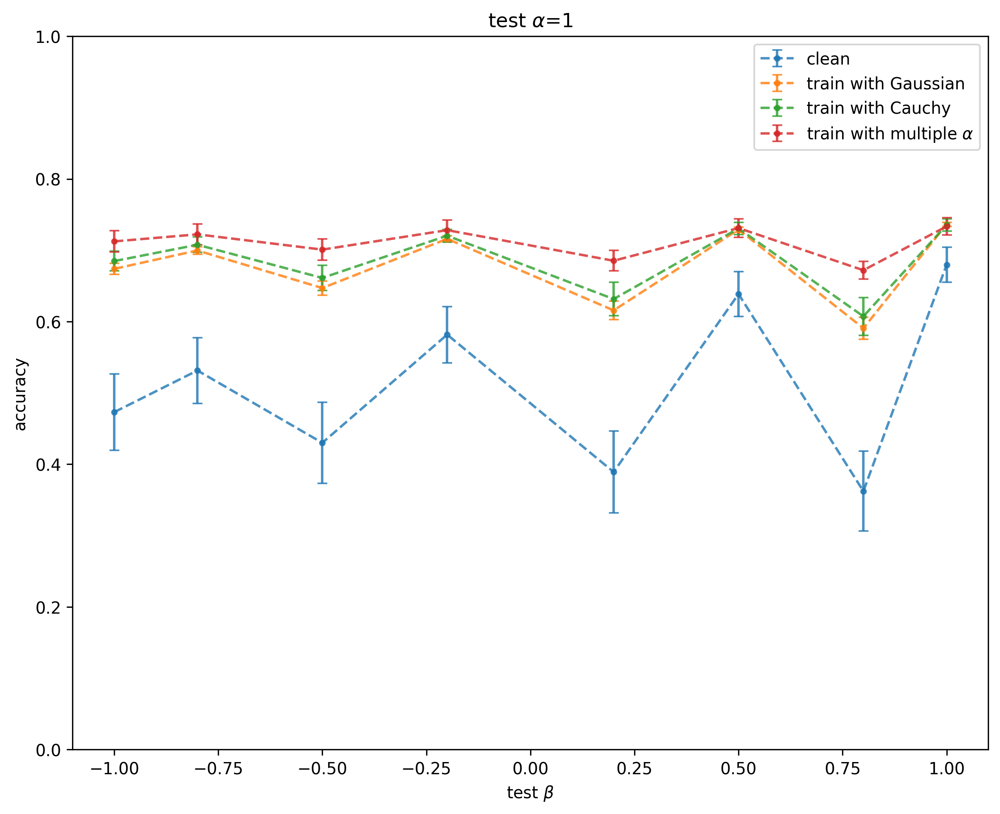

In [6]:
j = 4
plt.figure(figsize=[10,8],dpi=300)
result_clean = mean_list[0].reshape(7, 8)[j]
std_clean = std_list[0].reshape(7, 8)[j]
result_gaussian = mean_list[1].reshape(7, 8)[j]
std_gaussian = std_list[1].reshape(7, 8)[j]
result_cauchy = mean_list[7].reshape(7, 8)[j]
std_cauchy = std_list[7].reshape(7, 8)[j]
result_multiple = mean_list[2].reshape(7, 8)[j]
std_multiple = std_list[2].reshape(7, 8)[j]
beta_list = [0.2, -0.2, 0.5, -0.5, 0.8, -0.8, 1, -1]
idx = [7, 5, 3, 1, 0, 2, 4, 6]
x = [beta_list[id] for id in idx]
plt.errorbar(x, result_clean,yerr=std_clean,capsize=3,fmt='--.',alpha=0.8,label ='clean')
plt.errorbar(x, result_gaussian,yerr=std_gaussian,capsize=3,fmt='--.',alpha=0.8,label ='train with Gaussian')
plt.errorbar(x, result_cauchy,yerr=std_cauchy,capsize=3,fmt='--.',alpha=0.8,label ='train with Cauchy')
plt.errorbar(x, result_multiple,yerr=std_multiple,capsize=3,fmt='--.',alpha=0.8,label ='train with multiple $\\alpha$')
plt.xlabel('test $\\beta$')
plt.ylabel('accuracy')
plt.legend()
plt.ylim(0,1)
plt.title('test $\\alpha$=1')
plt.savefig('figure/mnist_assy.png')
plt.show()

3 3


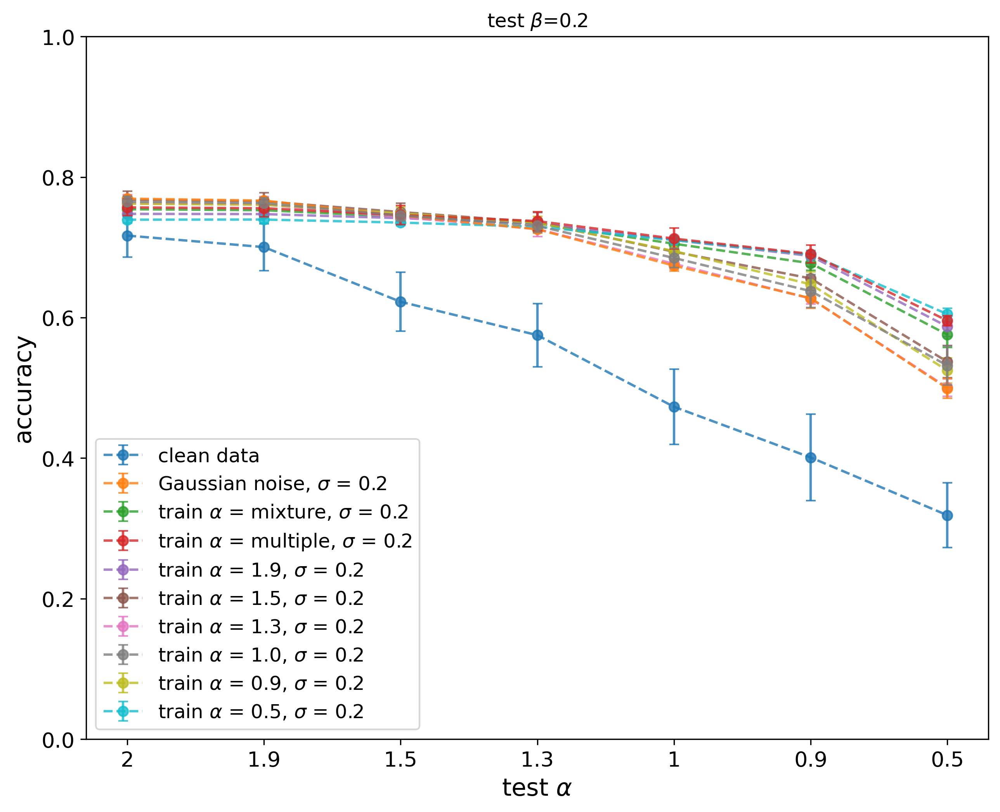

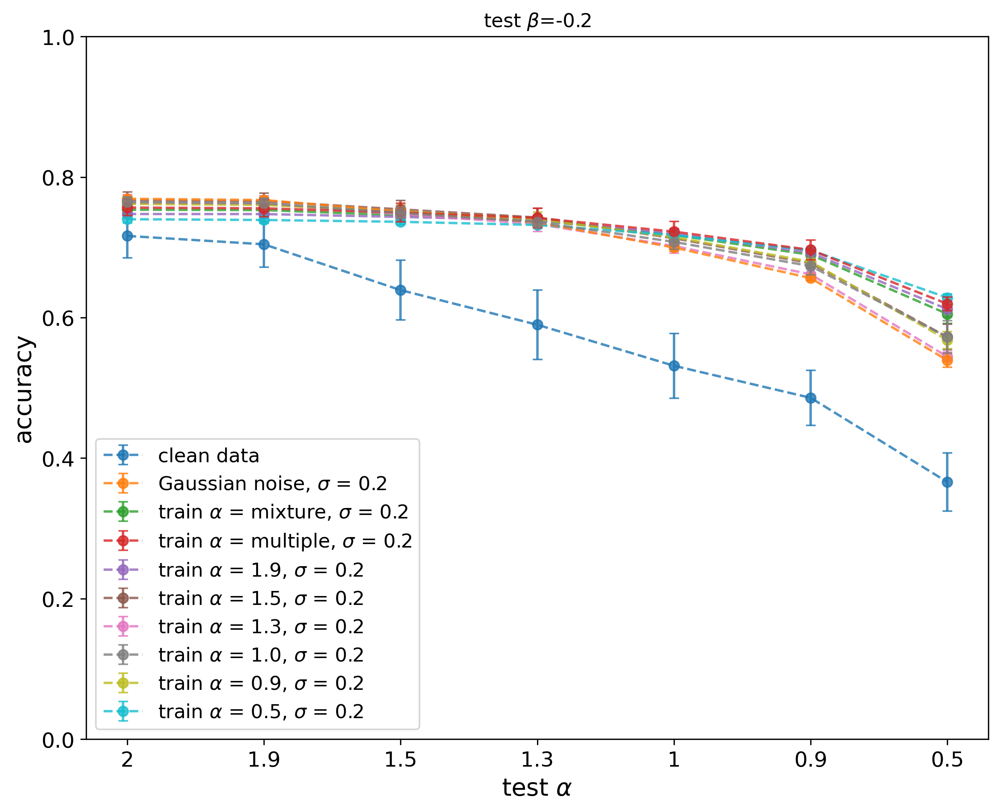

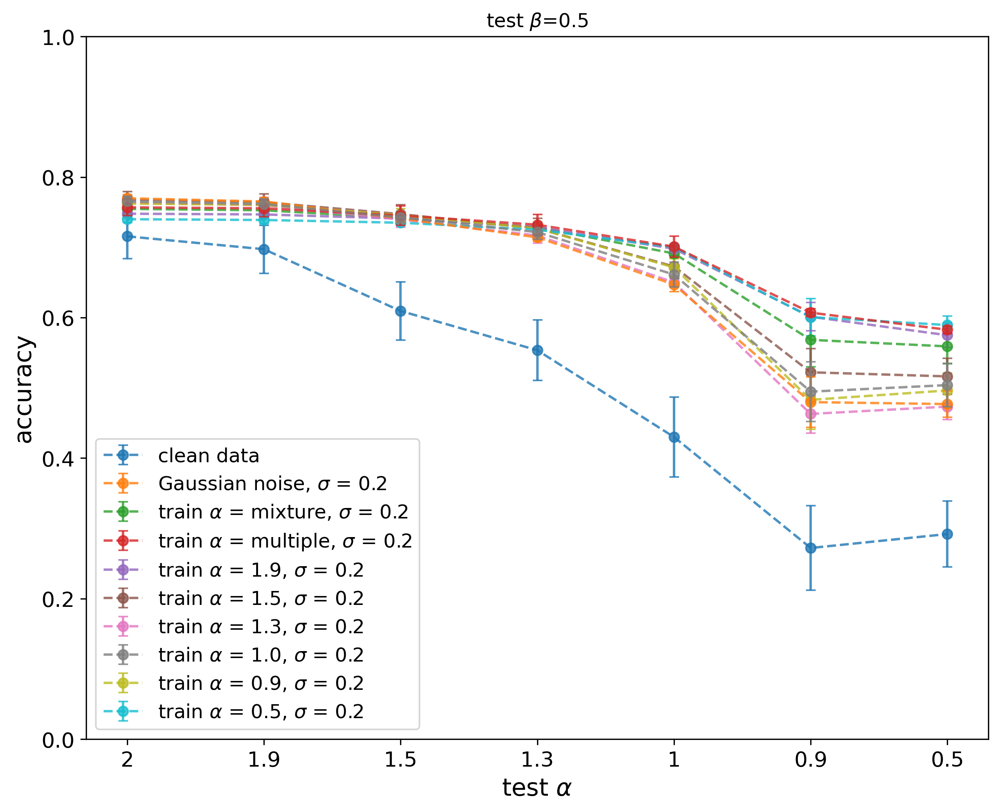

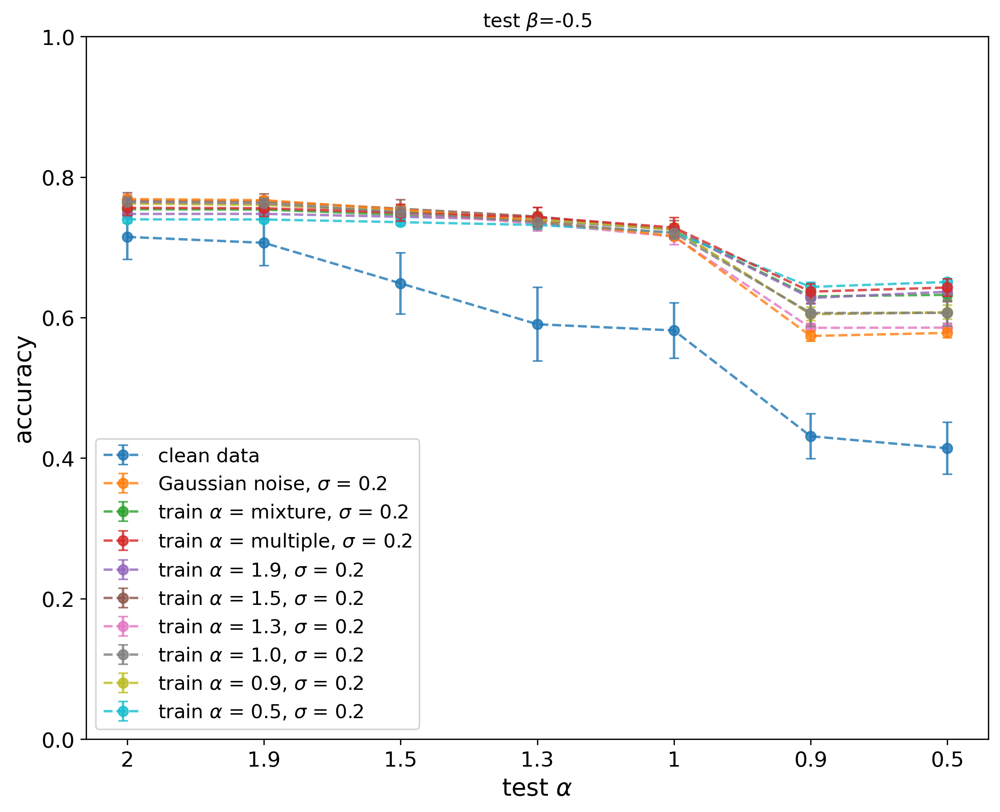

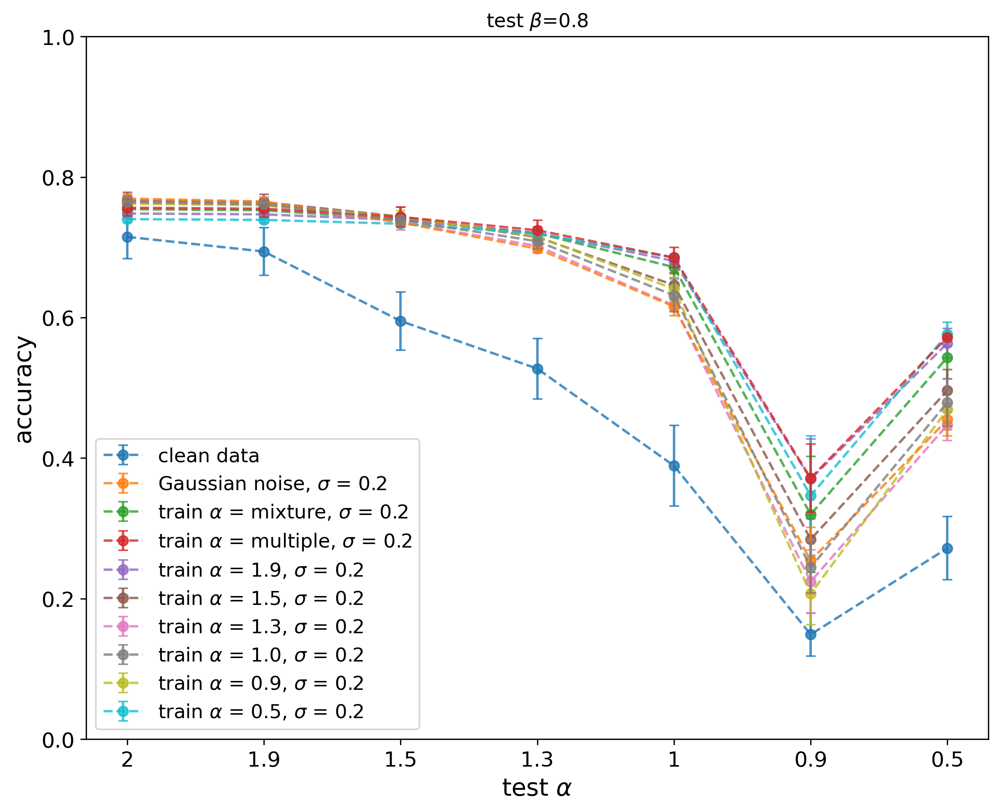

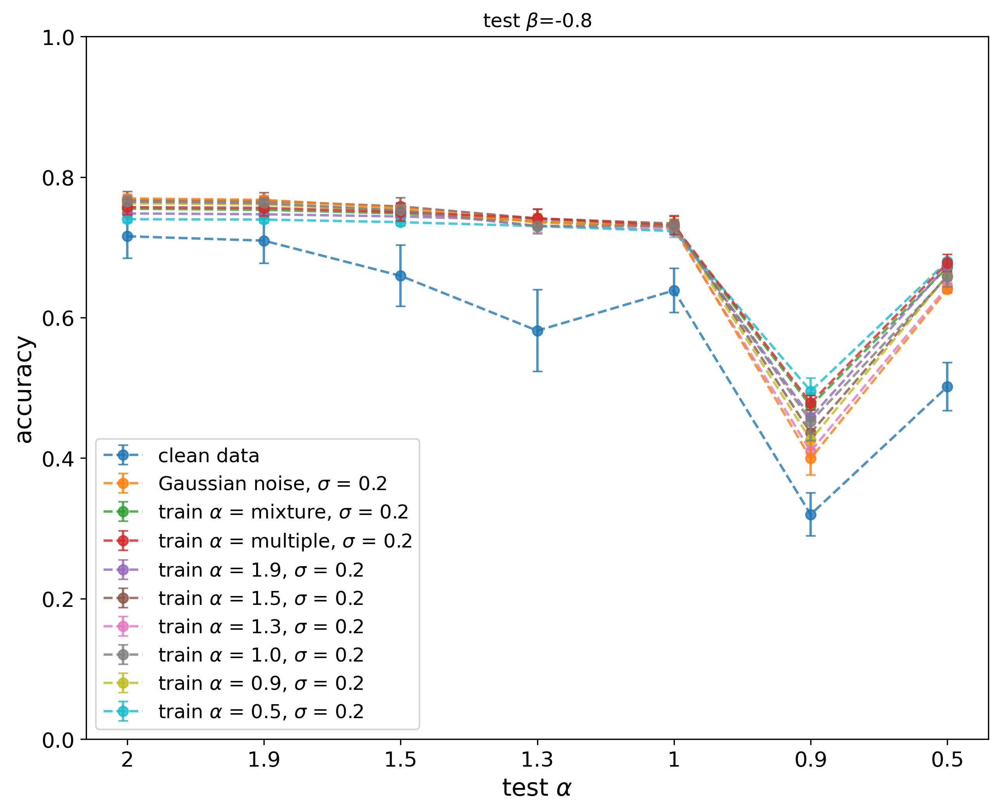

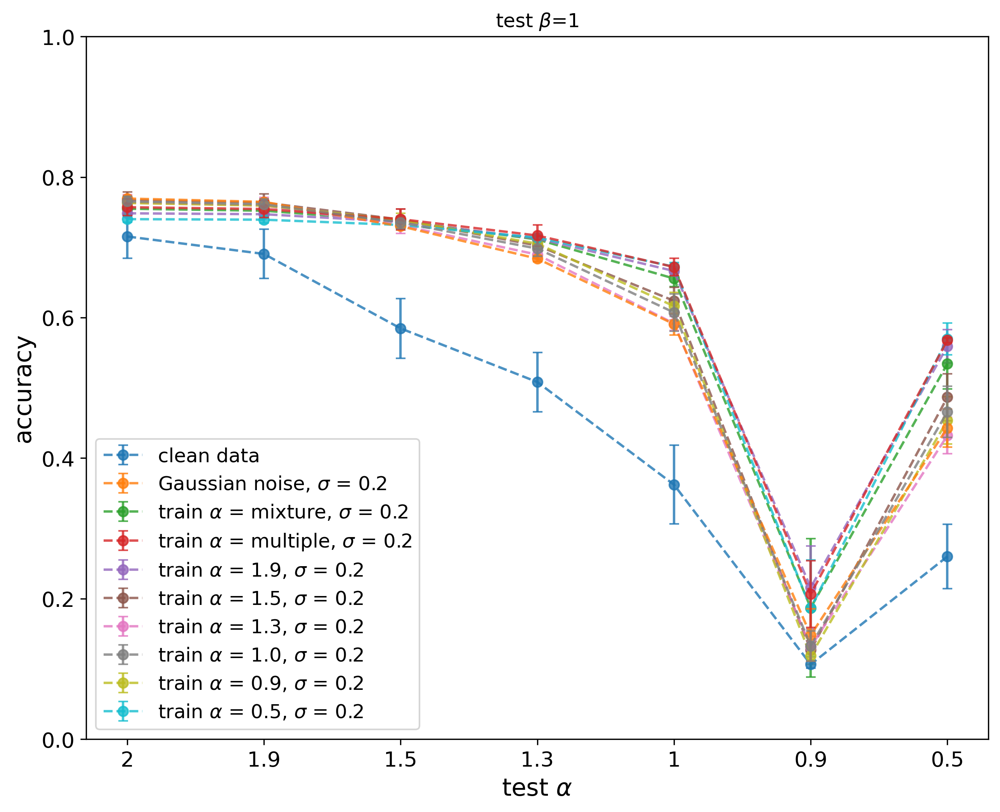

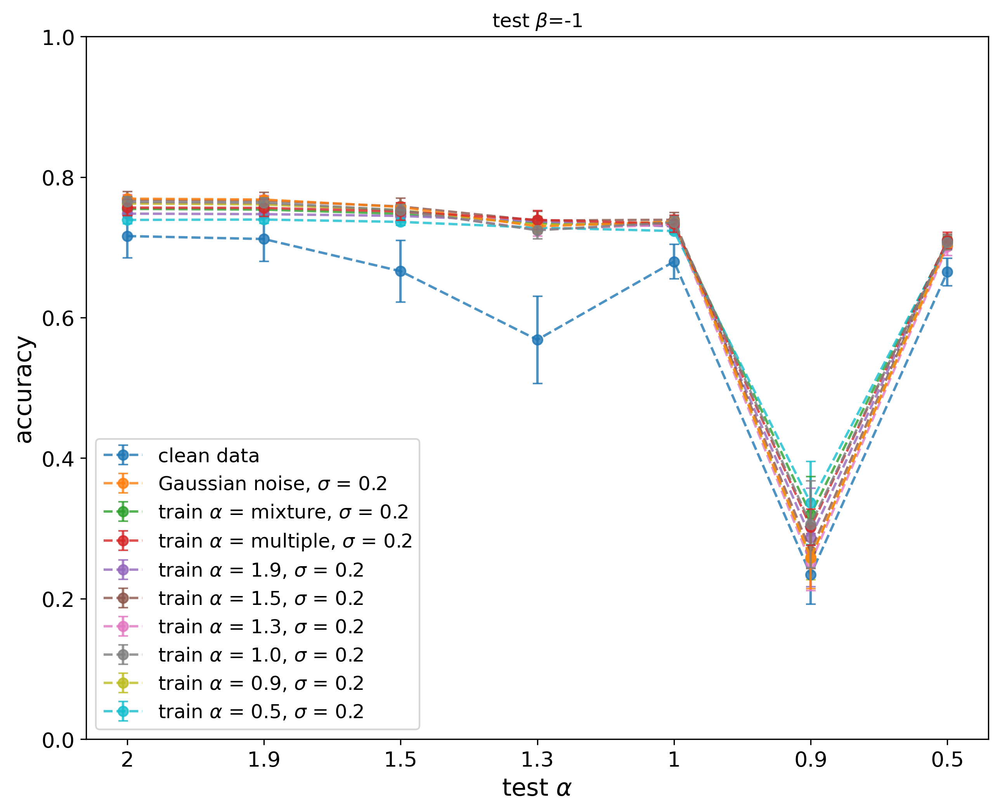

In [9]:
from matplotlib import pyplot
import seaborn as sns
for depth, width in [(3, 3), ]:
    print(depth, width)
    colors = sns.color_palette(n_colors = 10)
    # acc
    # plt.figure(dpi=300)
    alphas = [0.0,2.0,'mixture','multiple',1.9,1.5,1.3,1.0,0.9,0.5]
    for num, beta in enumerate([0.2, -0.2, 0.5, -0.5, 0.8, -0.8, 1, -1]):
        plt.figure(figsize=(10, 8),dpi=300)
        i = 0
        for alpha in alphas:
            # if alpha != 'multiple' and alpha != 'mixture':
            #     alpha = float(alpha)
        # for alpha in [1.9]:
            color=colors[i]
            sigma = 0.2
            acc_path = f"../results/acc_FCN_width{width}_depth{depth}_b64_alpha{alpha}_sigma{sigma}_testonassymetric.txt"
            if os.path.exists(acc_path) == 0:
                print('no exists,', acc_path)
                continue
            f = open(acc_path, 'rb')
            try:
                acc = pickle.load(f)
            except:
                print("the file is empty, alpha={}".format(alpha))
                continue
            df = pd.DataFrame(acc)
            npdf = np.array(df)
            means = np.array(npdf.mean(axis=0).round(decimals=4)).reshape(7, 8)[:, num]
            stds = np.array(npdf.std(axis=0).round(decimals=4)).reshape(7, 8)[:, num]
            x = ['2', '1.9', '1.5', '1.3', '1', '0.9', '0.5']
            if alpha == 0:
                labels = 'clean data'
                zorder = 1
            elif alpha == 2:
                labels = 'Gaussian noise, $\sigma$ = {}'.format(sigma)
                zorder = 2
            else:
                labels = 'train $\\alpha$ = {}, $\sigma$ = {}'.format(alpha, sigma)
                if alpha == "multiple" or alpha == 1:
                    zorder = 3
                else:
                    zorder = 1
            plt.errorbar(x,means,yerr=stds,capsize=3,fmt='--o',alpha=0.8,color = color,label =labels, zorder=zorder)
            i=i+1
        plt.xticks(fontsize=13)
        plt.yticks(fontsize=13)
        plt.ylim(0,1)
        plt.legend(loc=0,fontsize=12)#图例
        plt.xlabel("test $\\alpha$",fontsize=15)#横坐标名字
        plt.ylabel("accuracy",fontsize=15)#纵坐标名字
        plt.title("test $\\beta$={}".format(beta))
        plt.show()

In [50]:
import itertools
alpha_beta = list(itertools.product(alpha_test_list, beta_list))

In [51]:
res = pd.DataFrame(mean_list, columns=alpha_beta, index=alphas)
res.to_csv('../results/csv/testonassymetric.csv')

In [44]:
np.asarray(mean_list).reshape(-1, 7, 8)

array([[[0.7167, 0.7162, 0.7156, 0.7148, 0.7149, 0.7157, 0.7154, 0.716 ],
        [0.7003, 0.7043, 0.6973, 0.7064, 0.694 , 0.7095, 0.6906, 0.7118],
        [0.6225, 0.6391, 0.6094, 0.6487, 0.5951, 0.6594, 0.5846, 0.666 ],
        [0.575 , 0.5898, 0.5535, 0.5905, 0.5273, 0.5814, 0.5083, 0.5684],
        [0.473 , 0.5314, 0.43  , 0.5817, 0.3891, 0.6386, 0.3622, 0.6797],
        [0.4009, 0.4858, 0.2721, 0.4311, 0.149 , 0.3198, 0.1064, 0.2341],
        [0.3187, 0.3659, 0.2919, 0.414 , 0.2718, 0.5016, 0.26  , 0.665 ]],

       [[0.7693, 0.7691, 0.7698, 0.7687, 0.7694, 0.7696, 0.7694, 0.7693],
        [0.7665, 0.7673, 0.7652, 0.7671, 0.7652, 0.7676, 0.7647, 0.768 ],
        [0.7452, 0.7509, 0.7411, 0.7537, 0.7353, 0.7559, 0.73  , 0.7574],
        [0.7257, 0.7354, 0.7142, 0.737 , 0.698 , 0.7355, 0.6839, 0.7297],
        [0.6739, 0.6997, 0.647 , 0.716 , 0.6157, 0.7291, 0.5907, 0.7365],
        [0.6275, 0.6562, 0.4797, 0.5738, 0.2543, 0.3995, 0.1481, 0.2584],
        [0.4992, 0.5391, 0.4769, 0.5

test on GMM, student-t, generalized gaussian, salt and pepper noise

generalized gaussian

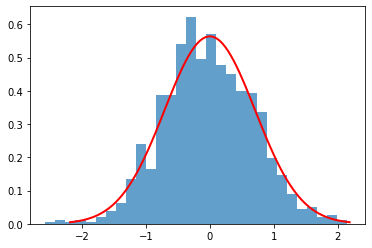

In [2]:
# generalized gaussian
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gennorm

# 设置广义高斯分布的参数
shape = 2 # 形状参数
loc = 0.0  # 位置参数
scale = 1.0  # 尺度参数

# 生成广义高斯随机变量
gen_norm_rv = gennorm.rvs(shape, loc=loc, scale=scale, size=1000)

# 绘制随机变量的直方图
plt.hist(gen_norm_rv, bins=30, density=True, alpha=0.7)

# 绘制概率密度函数曲线
x = np.linspace(gennorm.ppf(0.001, shape, loc=loc, scale=scale),
                gennorm.ppf(0.999, shape, loc=loc, scale=scale), 100)
plt.plot(x, gennorm.pdf(x, shape, loc=loc, scale=scale), 'r-', lw=2)

# 显示图形
plt.show()


In [3]:
X, y = fetch_openml('mnist_784', version=1, return_X_y=True)
X_tr, X_te = X[:60000], X[60000:]
y_tr, y_te = y[:60000], y[60000:]

In [7]:
aug_times_test = 10
encoder = LabelEncoder()
sigma = 0.2
noise_scale = np.sqrt(2) * sigma * 255

In [15]:
def gg_noise(img, shape, loc, scale):
    # 产生stable noise
    noise = gennorm.rvs(shape, loc=loc, scale=scale, size=img.shape)
    # 将噪声和图片叠加
    noisy_out = img + noise
    # 将超过 255 的置 255，低于 0 的置 0
    noisy_out = np.clip(noisy_out, 0, 255)
    # 取整
    noisy_out = np.uint(noisy_out)
    return noisy_out  #, noise # 这里也会返回噪声，注意返回值

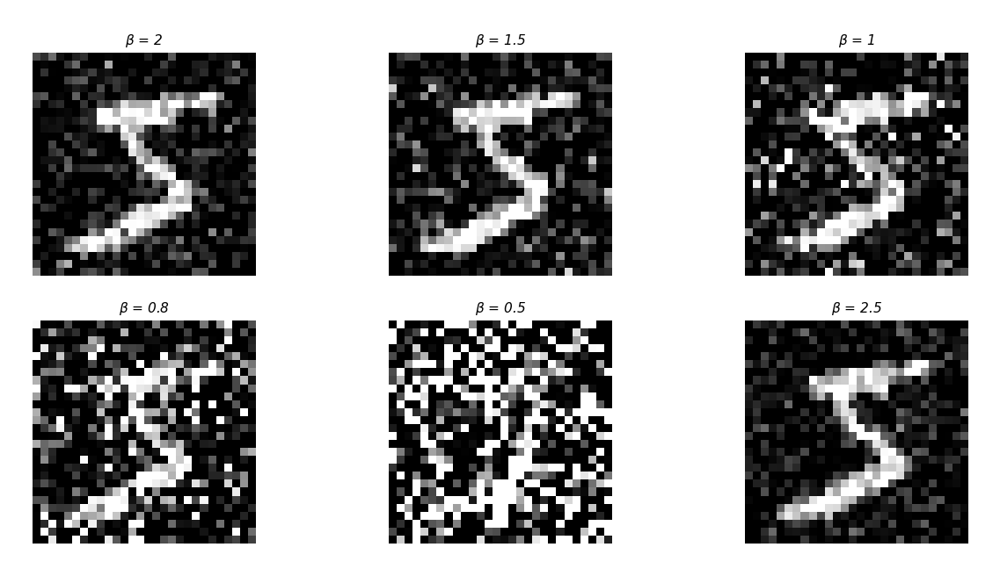

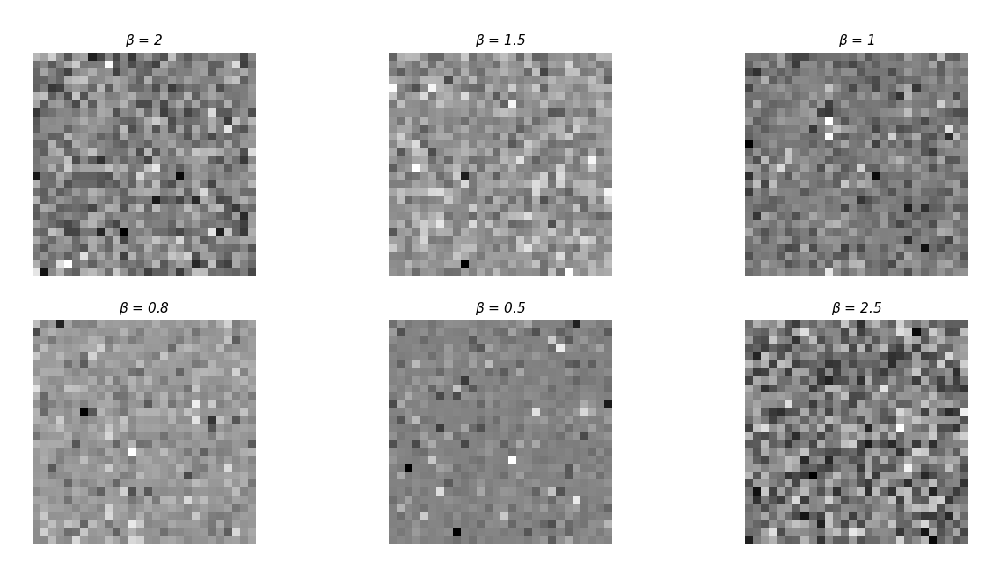

In [6]:
import matplotlib.image as mping
# 以第一张图片为例画一下加stable噪声的效果
# 读取图片
src = np.asarray(X[0]).reshape(28,28)

# 创建绘图 figure
fig_out = plt.figure(figsize=(4, 2), dpi=370) # figsize宽高比
fig_noise = plt.figure(figsize=(4, 2), dpi=370)

ax = 1  #ax：第ax张子图
for i in [2, 1.5, 1, 0.8, 0.5, 2.5]:
    
    # 将图片和不同的噪声叠加
    noisy_out, noise = gg_noise(img = src, shape = i, loc = 0, scale=noise_scale)
    # 创建 AxesSubplot 对象
    ax_out = fig_out.add_subplot(2,3,ax)    #3*7的画布，第ax张子图
    ax_noise = fig_noise.add_subplot(2,3,ax)
    # 将丑兮兮的坐标抽去掉
    ax_out.axis('off')
    ax_noise.axis('off')
    # 设置标题
    ax_out.set_title(r'$\beta$ = '+str(round(i,2)), loc='center', fontsize=3, fontstyle='italic',pad=2)  #pad:标题与图片的距离
    ax_noise.set_title(r'$\beta$ = '+str(round(i,2)), loc='center', fontsize=3, fontstyle='italic',pad=2)
    # 图片展示
    ax_out.imshow(noisy_out, cmap='gray')
    ax_noise.imshow(noise, cmap='gray')
#     ax_noise.imshow(noise * 255, cmap='gray')  #这句和上图一句画出来是一样的，不知道原理是什么
    ax += 1

# 图片显示
plt.show()


In [9]:
X_noise_test = np.tile(X_te,(aug_times_test,1))
X_noise_test = gg_noise(X_noise_test, shape = 2, loc=0, scale=noise_scale)[0]

In [11]:
X_noise_test.shape

(100000, 784)

In [17]:
pool = mp.Pool(max(int(mp.cpu_count()/2), 16))  # 创建进程池，使用CPU核心数/2作为进程数
beta = 2
res = [pool.apply_async(gg_noise, args=(img, beta, 0, noise_scale)) for img in X_noise_test]
noisy = []
for p in tqdm(res):
    noisy.append(p.get())
pool.close()  # 关闭进程池
pool.join()  # 等待所有子进程完成

100%|██████████| 100000/100000 [01:32<00:00, 1078.21it/s]


In [28]:
for beta in [2,1.5,1,0.5,2.5]:
    X_noise_test = np.tile(X_te,(aug_times_test,1))
    pool = mp.Pool(max(int(mp.cpu_count()/2), 16))  # 创建进程池，使用CPU核心数/2作为进程数
    res = [pool.apply_async(gg_noise, args=(img, beta, 0, noise_scale)) for img in X_noise_test]
    noisy = []
    for p in tqdm(res):
        noisy.append(p.get())
    pool.close()  # 关闭进程池
    pool.join()  # 等待所有子进程完成
    X_noise_test = np.asarray(noisy)
    X_test = np.vstack((X_te, X_noise_test))
    X_test = X_test / 255.
    X_test = (X_test - np.mean(X_test)) / np.std(X_test)
    y_test = np.tile(y_te, aug_times_test+1)
    y_test = encoder.fit_transform(y_test)
    fw = open(f"./testset/gg/beta{beta}_testset_{sigma}.txt", "wb")
    pickle.dump((X_test, y_test), fw)

100%|██████████| 100000/100000 [01:24<00:00, 1188.08it/s]


In [11]:
# test acc
beta_list = [2,1.5,1,0.5,2.5]
b = 64
alpha_train_list = [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 0.5, 'mixture', 'multiple']
opt_sigma = {0.0: 0.1,
 2.0: 0.25,
 'multiple': 0.25,
 'mixture': 0.25,
 1.9: 0.35,
 1.5: 0.2,
 1.3: 0.15,
 1.0: 0.1,
 0.9: 0.1,
 0.5: 0.05}
for alpha_train in alpha_train_list:
    sigma_train = opt_sigma[alpha_train]
    print(f'sigma_train={sigma_train}')
    for depth, width in [(3, 3)]:
        if os.path.exists("../results/acc_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_testongg.txt".format(width,depth,b,alpha_train,sigma)):
            print("../results/acc_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_testongg.txt".format(width,depth,b,alpha_train,sigma), 'exists!')
            continue
        print(f'depth={depth}, width={width}')
        if depth != 3:
            lr = 0.0005
            iters = 50000
        else:
            lr = 0.001
            iters = 10000
        model = Sequential()
        for j in range(depth-2):
            model.add(Dense(width, activation='relu',input_shape=(1,784)))
        model.add(Dense(10, activation='softmax'))
        model.compile(loss=keras.losses.categorical_crossentropy,
                            optimizer=Adam(lr=lr),
                            metrics=['accuracy'])
        ls_acc_repeat = []
        for num in range(5):
            model.load_weights('../models/mnist_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_num{}_lr{}_iter{}.h5'.format(width, depth, b, alpha_train, sigma_train, num, lr, iters))
            ls_acc = []
            for beta in beta_list:
                print('beta=',beta)
                X_test, y_test = pickle.load(open(f"./testset/gg/beta{beta}_testset_{sigma}.txt", 'rb'))
                X_test = X_test.reshape(-1,1,784)
                y_pred = model.predict(X_test)
                y_pred_label = np.argmax(y_pred, axis=2).flatten()
                y_pred = y_pred.squeeze()
                acc = accuracy_score(y_test, y_pred_label)
                print(acc)
                ls_acc.append(acc)
            ls_acc_repeat.append(ls_acc)
        with open("../results/acc_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_testongg.txt".format(width,depth,b,alpha_train,sigma), "wb") as path_acc:
            pickle.dump(ls_acc_repeat, path_acc)

sigma_train=0.1
depth=3, width=3
beta= 2


0.6844272727272728
beta= 1.5
0.6391454545454546
beta= 1
0.49476363636363635
beta= 0.5
0.2074
beta= 2.5
0.7011090909090909
beta= 2
0.7576090909090909
beta= 1.5
0.7251272727272727
beta= 1
0.5950454545454545
beta= 0.5
0.23407272727272727
beta= 2.5
0.769090909090909
beta= 2
0.7310090909090909
beta= 1.5
0.6881636363636363
beta= 1
0.5287
beta= 0.5
0.21259090909090908
beta= 2.5
0.7449090909090909
beta= 2
0.7342909090909091
beta= 1.5
0.6998545454545455
beta= 1
0.5622909090909091
beta= 0.5
0.21394545454545455
beta= 2.5
0.7478727272727272
beta= 2
0.6759636363636363
beta= 1.5
0.6209090909090909
beta= 1
0.4420636363636364
beta= 0.5
0.1562909090909091
beta= 2.5
0.6971636363636363
sigma_train=0.25
depth=3, width=3
beta= 2
0.7663
beta= 1.5
0.7541636363636364
beta= 1
0.6931363636363637
beta= 0.5
0.27941818181818184
beta= 2.5
0.7694
beta= 2
0.7641181818181818
beta= 1.5
0.7557818181818182
beta= 1
0.7033
beta= 0.5
0.27084545454545456
beta= 2.5
0.7680636363636364
beta= 2
0.7712363636363636
beta= 1.5
0.760

3 3


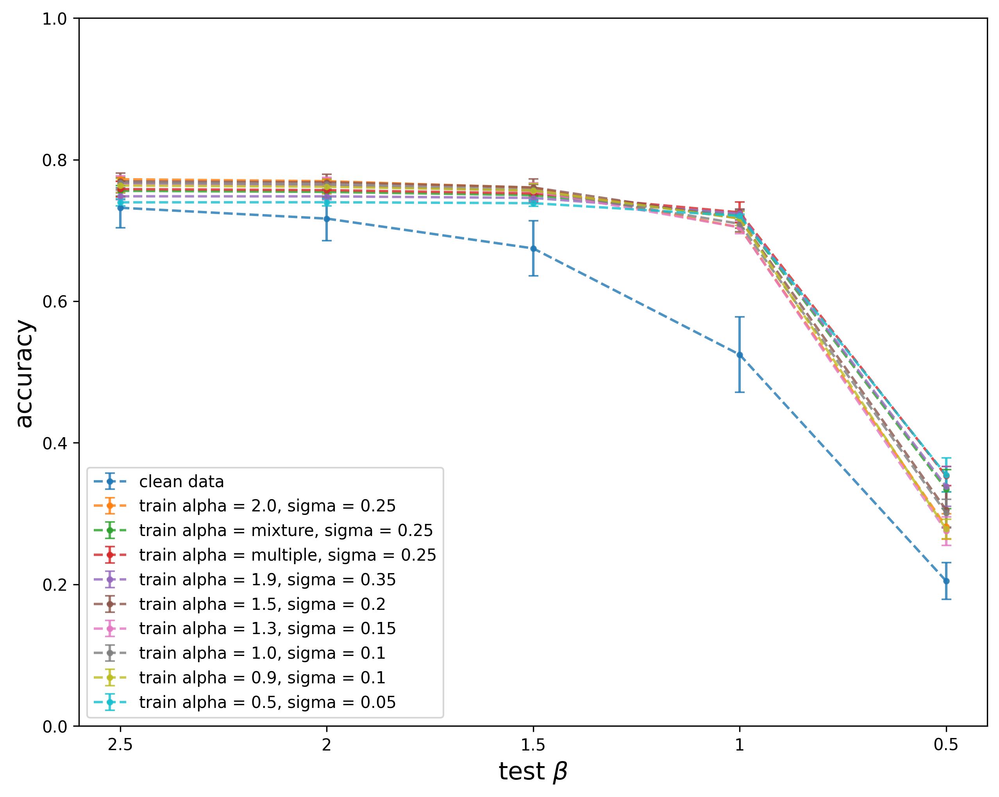

In [16]:
from matplotlib import pyplot
import seaborn as sns
beta_list = [2.5,2,1.5,1,0.5]

for depth, width in [(3, 3), ]:
    print(depth, width)
    colors = sns.color_palette(n_colors = 10)
    # acc
    # plt.figure(dpi=300)
    alphas = [0.0,2.0,'mixture','multiple',1.9,1.5,1.3,1.0,0.9,0.5]
    plt.figure(figsize=(10, 8),dpi=300)
    i = 0
    mean_list = []
    for alpha in alphas:
        color=colors[i]
        sigma = 0.2
        sigma_train=opt_sigma[alpha]
        acc_path = f"../results/acc_FCN_width{width}_depth{depth}_b64_alpha{alpha}_sigma{sigma}_testongg.txt"
        if os.path.exists(acc_path) == 0:
            print('no exists,', acc_path)
            continue
        f = open(acc_path, 'rb')
        try:
            acc = pickle.load(f)
        except:
            print("the file is empty, alpha={}".format(alpha))
            continue
        df = pd.DataFrame(acc)
        npdf = np.array(df)
        means = np.array(npdf.mean(axis=0).round(decimals=4))
        stds = np.array(npdf.std(axis=0).round(decimals=4))
        means = np.concatenate(([means[-1]], means[:-1]))
        stds = np.concatenate(([stds[-1]], stds[:-1]))
        mean_list.append(means)
        x = [str(beta) for beta in beta_list]
        if alpha == 0:
            labels = 'clean data'
        else:
            labels = 'train alpha = {}, sigma = {}'.format(alpha, sigma_train)
        plt.errorbar(x,means,yerr=stds,capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
        i=i+1
    plt.ylim(0,1)
    plt.xlabel("test $\\beta$",fontsize=15)#横坐标名字
    plt.ylabel("accuracy",fontsize=15)#纵坐标名字
    plt.legend()
    plt.show()

In [21]:
res = pd.DataFrame(mean_list, columns=beta_list, index=alphas)
res = res[[2.5, 2, 1.5, 1, 0.5]]
res.to_csv('../results/csv/testongg.csv')

student-t

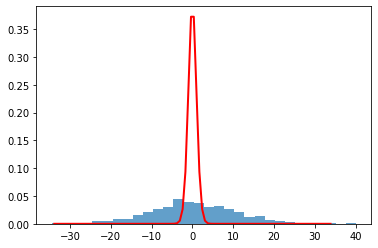

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import t

# 设置t分布的自由度参数
df = 30  # 自由度参数
scale = 10
# 生成t分布随机变量
t_rv = t.rvs(df, scale=scale, size=1000)

# 绘制随机变量的直方图
plt.hist(t_rv, bins=30, density=True, alpha=0.7)

# 绘制概率密度函数曲线
x = np.linspace(t.ppf(0.001, df, scale=scale), t.ppf(0.999, df, scale=scale), 100)
plt.plot(x, t.pdf(x, df), 'r-', lw=2)

# 显示图形
plt.show()

In [8]:
aug_times_test = 10
encoder = LabelEncoder()
sigma = 0.2
noise_scale = sigma * 255

In [17]:
def t_noise(img, df, loc, scale):
    # 产生stable noise
    noise = t.rvs(df, loc=loc, scale=scale, size=img.shape)
    # 将噪声和图片叠加
    noisy_out = img + noise
    # 将超过 255 的置 255，低于 0 的置 0
    noisy_out = np.clip(noisy_out, 0, 255)
    # 取整
    noisy_out = np.uint(noisy_out)
    return noisy_out #, noise # 这里也会返回噪声，注意返回值

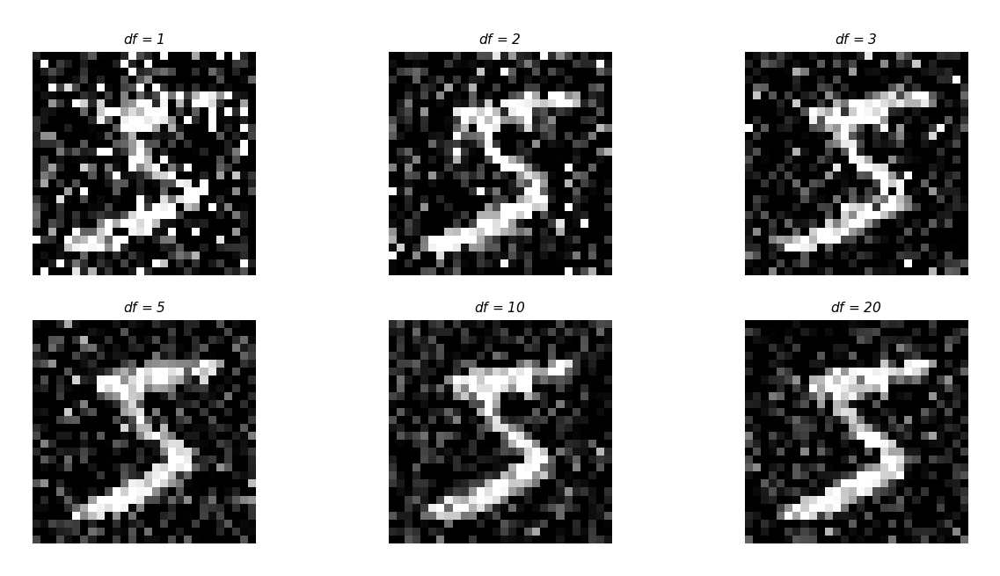

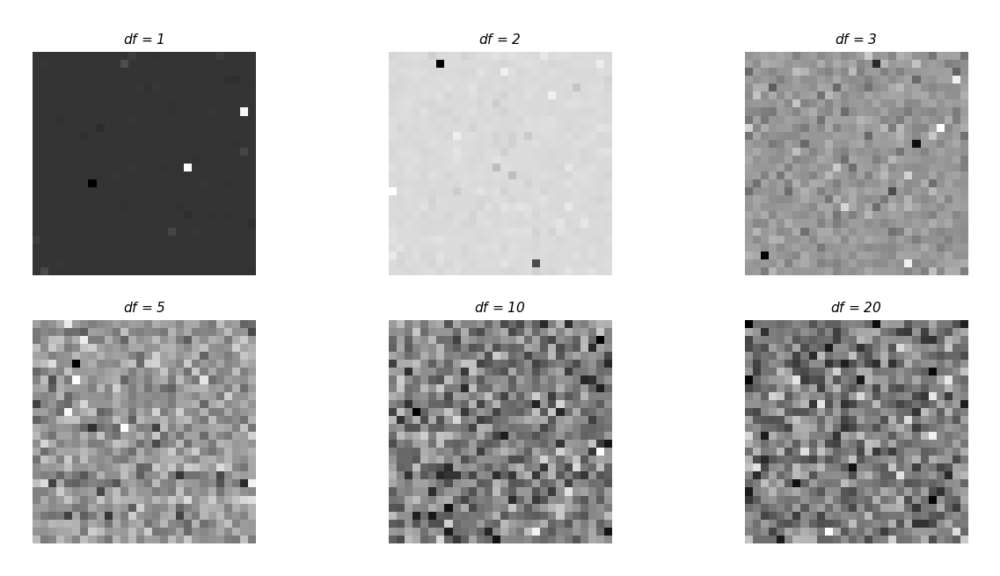

In [33]:
import matplotlib.image as mping
# 以第一张图片为例画一下加stable噪声的效果
# 读取图片
src = np.asarray(X[0]).reshape(28,28)

# 创建绘图 figure
fig_out = plt.figure(figsize=(4, 2), dpi=370) # figsize宽高比
fig_noise = plt.figure(figsize=(4, 2), dpi=370)

ax = 1  #ax：第ax张子图
for df in [1, 2, 3, 5, 10, 20]:
    # 将图片和不同的噪声叠加
    noisy_out, noise = t_noise(img = src, df = df, loc = 0, scale=noise_scale)
    # 创建 AxesSubplot 对象
    ax_out = fig_out.add_subplot(2,3,ax)    #3*7的画布，第ax张子图
    ax_noise = fig_noise.add_subplot(2,3,ax)
    # 将丑兮兮的坐标抽去掉
    ax_out.axis('off')
    ax_noise.axis('off')
    # 设置标题
    ax_out.set_title(r'$df$ = '+str(df), loc='center', fontsize=3, fontstyle='italic',pad=2)  #pad:标题与图片的距离
    ax_noise.set_title(r'$df$ = '+str(df), loc='center', fontsize=3, fontstyle='italic',pad=2)
    # 图片展示
    ax_out.imshow(noisy_out, cmap='gray')
    ax_noise.imshow(noise, cmap='gray')
#     ax_noise.imshow(noise * 255, cmap='gray')  #这句和上图一句画出来是一样的，不知道原理是什么
    ax += 1

# 图片显示
plt.show()


In [20]:
# for df in [1, 2, 3, 5, 10, 20]:
for df in [0.1, 0.3, 0.5, 0.8, 1, 1.3, 1.5, 1.7, 1.9, 2, 3]:
    X_noise_test = np.tile(X_te,(aug_times_test,1))
    pool = mp.Pool(max(int(mp.cpu_count()/2), 16))  # 创建进程池，使用CPU核心数/2作为进程数
    res = [pool.apply_async(t_noise, args=(img, df, 0, noise_scale)) for img in X_noise_test]
    noisy = []
    for p in tqdm(res):
        noisy.append(p.get())
    pool.close()  # 关闭进程池
    pool.join()  # 等待所有子进程完成
    X_noise_test = np.asarray(noisy)
    X_test = np.vstack((X_te, X_noise_test))
    X_test = X_test / 255.
    X_test = (X_test - np.mean(X_test)) / np.std(X_test)
    y_test = np.tile(y_te, aug_times_test+1)
    y_test = encoder.fit_transform(y_test)
    fw = open(f"./testset/t/df{df}_testset_{sigma}.txt", "wb")
    pickle.dump((X_test, y_test), fw)

 43%|████▎     | 42976/100000 [00:08<00:12, 4506.74it/s]

In [6]:
# test acc
df_list = [0.1, 0.3, 0.5, 0.8, 1, 1.3, 1.5, 1.7, 1.9, 2, 3]
b = 64
alpha_train_list = [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 0.5, 'mixture', 'multiple']
opt_sigma = {0.0: 0.1,
 2.0: 0.25,
 'multiple': 0.25,
 'mixture': 0.25,
 1.9: 0.35,
 1.5: 0.2,
 1.3: 0.15,
 1.0: 0.1,
 0.9: 0.1,
 0.5: 0.05}
sigma=0.2
for alpha_train in alpha_train_list:
    sigma_train = opt_sigma[alpha_train]
    print(f'sigma={sigma}')
    for depth, width in [(3, 3)]:
        if os.path.exists("../results/acc_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_testont.txt".format(width,depth,b,alpha_train,sigma)):
            print("../results/acc_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_testont.txt".format(width,depth,b,alpha_train,sigma), 'exists!')
            continue
        print(f'depth={depth}, width={width}')
        if depth != 3:
            lr = 0.0005
            iters = 50000
        else:
            lr = 0.001
            iters = 10000
        model = Sequential()
        for j in range(depth-2):
            model.add(Dense(width, activation='relu',input_shape=(1,784)))
        model.add(Dense(10, activation='softmax'))
        model.compile(loss=keras.losses.categorical_crossentropy,
                            optimizer=Adam(lr=lr),
                            metrics=['accuracy'])
        ls_acc_repeat = []
        for num in range(5):
            model.load_weights('../models/mnist_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_num{}_lr{}_iter{}.h5'.format(width, depth, b, alpha_train, sigma_train, num, lr, iters))
            ls_acc = []
            for df in df_list:
                print('df=',df)
                X_test, y_test = pickle.load(open(f"./testset/t/df{df}_testset_{sigma}.txt", 'rb'))
                X_test = X_test.reshape(-1,1,784)
                y_pred = model.predict(X_test)
                y_pred_label = np.argmax(y_pred, axis=2).flatten()
                y_pred = y_pred.squeeze()
                acc = accuracy_score(y_test, y_pred_label)
                print(acc)
                ls_acc.append(acc)
            ls_acc_repeat.append(ls_acc)
        with open("../results/acc_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_testont.txt".format(width,depth,b,alpha_train,sigma), "wb") as path_acc:
            pickle.dump(ls_acc_repeat, path_acc)

sigma=0.2
../results/acc_FCN_width3_depth3_b64_alpha0.0_sigma0.2_testont.txt exists!
sigma=0.2
../results/acc_FCN_width3_depth3_b64_alpha2.0_sigma0.2_testont.txt exists!
sigma=0.2
../results/acc_FCN_width3_depth3_b64_alpha1.9_sigma0.2_testont.txt exists!
sigma=0.2
../results/acc_FCN_width3_depth3_b64_alpha1.5_sigma0.2_testont.txt exists!
sigma=0.2
depth=3, width=3
df= 0.1
0.20223636363636363
df= 0.3
0.34483636363636366
df= 0.5
0.4692181818181818
df= 0.8
0.5888181818181818
df= 1
0.6309181818181818
df= 1.3
0.6741
df= 1.5
0.6917636363636364
df= 1.7
0.6998090909090909
df= 1.9
0.7113909090909091
df= 2
0.7146090909090909
df= 3
0.7329545454545454
df= 0.1
0.2201
df= 0.3
0.3487272727272727
df= 0.5
0.4618
df= 0.8
0.5842454545454545
df= 1
0.6314636363636363
df= 1.3
0.6831909090909091
df= 1.5
0.7040545454545455
df= 1.7
0.7185090909090909
df= 1.9
0.7261545454545455
df= 2
0.7312727272727273
df= 3
0.7527636363636364
df= 0.1
0.16835454545454545
df= 0.3
0.2958090909090909
df= 0.5
0.4294090909090909
df=

3 3


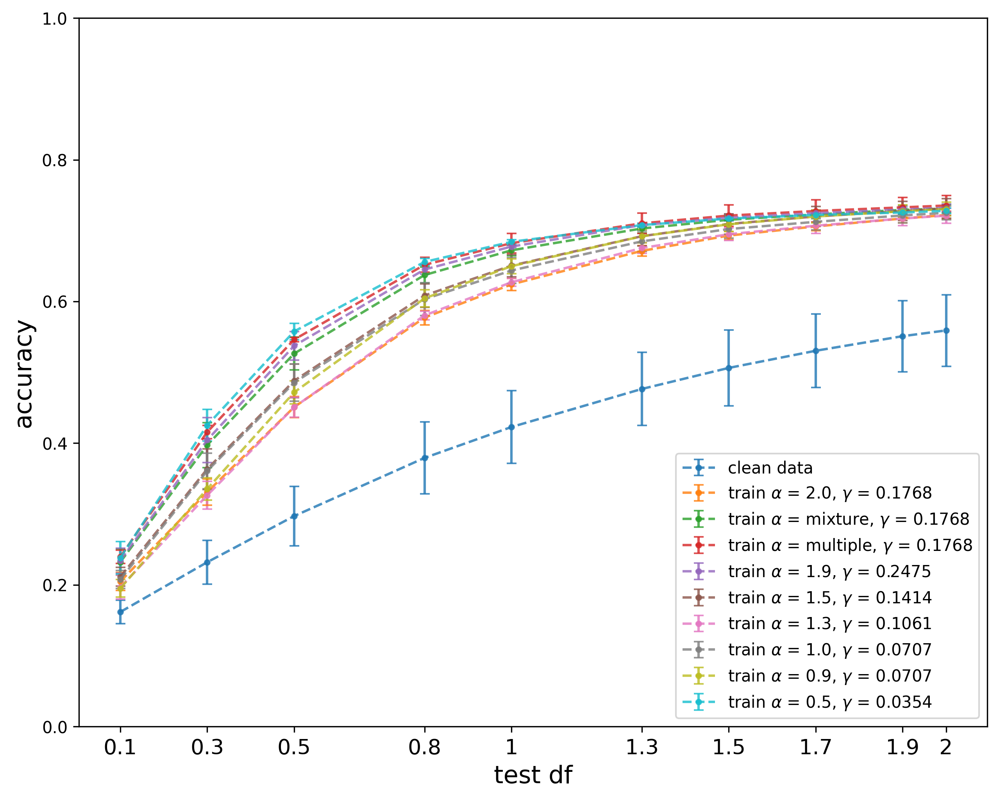

In [7]:
from matplotlib import pyplot
import seaborn as sns
opt_sigma = {0.0: 0.1,
 2.0: 0.25,
 'multiple': 0.25,
 'mixture': 0.25,
 1.9: 0.35,
 1.5: 0.2,
 1.3: 0.15,
 1.0: 0.1,
 0.9: 0.1,
 0.5: 0.05}
df_list = [0.1, 0.3, 0.5, 0.8, 1, 1.3, 1.5, 1.7, 1.9, 2, 3]
for depth, width in [(3, 3), ]:
    print(depth, width)
    colors = sns.color_palette(n_colors = 10)
    # acc
    # plt.figure(dpi=300)
    alphas = [0.0,2.0,'mixture','multiple',1.9,1.5,1.3,1.0,0.9,0.5]
    plt.figure(figsize=(10, 8),dpi=300)
    i = 0
    mean_list = []
    for alpha in alphas:
        color=colors[i]
        sigma = 0.2
        sigma_train=opt_sigma[alpha]
        acc_path = f"../results/acc_FCN_width{width}_depth{depth}_b64_alpha{alpha}_sigma{sigma}_testont.txt"
        if os.path.exists(acc_path) == 0:
            print('no exists,', acc_path)
            continue
        f = open(acc_path, 'rb')
        try:
            acc = pickle.load(f)
        except:
            print("the file is empty, alpha={}".format(alpha))
            continue
        df = pd.DataFrame(acc)
        npdf = np.array(df)
        means = np.array(npdf.mean(axis=0).round(decimals=4))
        stds = np.array(npdf.std(axis=0).round(decimals=4))
        mean_list.append(means)
        x = df_list[:-1]
        if alpha == 0:
            labels = 'clean data'
        else:
            labels = 'train $\\alpha$ = {}, $\gamma$ = {:.4f}'.format(alpha, sigma_train*np.sqrt(0.5))
        plt.errorbar(x,means[:-1],yerr=stds[:-1],capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
        i=i+1
    plt.ylim(0,1)
    plt.xticks(x, x, fontsize=13)
    plt.xlabel("test df",fontsize=15)#横坐标名字
    plt.ylabel("accuracy",fontsize=15)#纵坐标名字
    plt.legend()
    plt.savefig('./figure/mnist_t.png')
    plt.show()

In [23]:
res = pd.DataFrame(mean_list, columns=df_list, index=alphas)
print(res)
res.to_csv('../results/csv/testont.csv')

              1       2       3       5       10      20
0.0       0.4228  0.5591  0.6177  0.6633  0.6925  0.7049
2.0       0.6241  0.7220  0.7438  0.7587  0.7643  0.7678
mixture   0.6722  0.7310  0.7424  0.7502  0.7525  0.7538
multiple  0.6823  0.7354  0.7449  0.7526  0.7548  0.7567
1.9       0.6775  0.7320  0.7409  0.7462  0.7468  0.7481
1.5       0.6506  0.7314  0.7488  0.7598  0.7643  0.7666
1.3       0.6271  0.7211  0.7412  0.7547  0.7587  0.7621
1.0       0.6437  0.7251  0.7445  0.7555  0.7608  0.7637
0.9       0.6498  0.7305  0.7469  0.7566  0.7595  0.7613
0.5       0.6842  0.7279  0.7339  0.7379  0.7393  0.7400


salt and pepper noise

In [8]:
aug_times_test = 10
encoder = LabelEncoder()

In [41]:
import random
def salt_pepper_noise(image, ratio):
    # image必须是一维
    output = np.zeros(image.shape, np.uint8)

    for i in range(image.shape[0]):
        rand = random.random()
        if rand < ratio:  # salt pepper noise
            if random.random() > 0.5:  # change the pixel to 255
                output[i] = 255
            else:
                output[i] = 0
        else:
            output[i] = image[i]

    return output


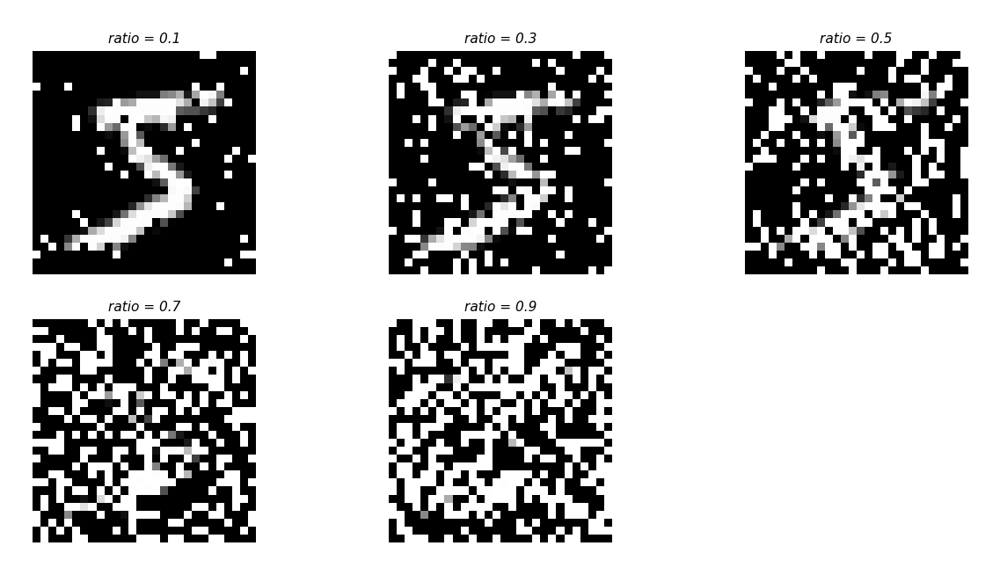

<Figure size 1480x740 with 0 Axes>

In [39]:
import matplotlib.image as mping
# 以第一张图片为例画一下加stable噪声的效果
# 读取图片
src = np.asarray(X[0]).reshape(28,28)

# 创建绘图 figure
fig_out = plt.figure(figsize=(4, 2), dpi=370) # figsize宽高比
fig_noise = plt.figure(figsize=(4, 2), dpi=370)

ax = 1  #ax：第ax张子图
for ratio in [0.1, 0.3, 0.5, 0.7, 0.9]:
    # 将图片和不同的噪声叠加
    noisy_out = salt_pepper_noise(image = src, ratio = ratio)
    # 创建 AxesSubplot 对象
    ax_out = fig_out.add_subplot(2,3,ax)    #3*7的画布，第ax张子图
    # 将丑兮兮的坐标抽去掉
    ax_out.axis('off')
    # 设置标题
    ax_out.set_title(r'ratio = '+str(ratio), loc='center', fontsize=3, fontstyle='italic',pad=2)  #pad:标题与图片的距离
    # 图片展示
    ax_out.imshow(noisy_out, cmap='gray')
    ax += 1

# 图片显示
plt.show()


In [43]:
for ratio in [0.1, 0.3, 0.5, 0.7, 0.9]:
    X_noise_test = np.tile(X_te,(aug_times_test,1))
    pool = mp.Pool(max(int(mp.cpu_count()/2), 16))  # 创建进程池，使用CPU核心数/2作为进程数
    res = [pool.apply_async(salt_pepper_noise, args=(img, ratio,)) for img in X_noise_test]
    noisy = []
    for p in tqdm(res):
        noisy.append(p.get())
    pool.close()  # 关闭进程池
    pool.join()  # 等待所有子进程完成
    X_noise_test = np.asarray(noisy)
    X_test = np.vstack((X_te, X_noise_test))
    X_test = X_test / 255.
    X_test = (X_test - np.mean(X_test)) / np.std(X_test)
    y_test = np.tile(y_te, aug_times_test+1)
    y_test = encoder.fit_transform(y_test)
    fw = open(f"./testset/salt_pepper/ratio{ratio}_testset.txt", "wb")
    pickle.dump((X_test, y_test), fw)

100%|██████████| 100000/100000 [00:12<00:00, 7818.04it/s]


In [13]:
# test acc
ratio_list = [0.1, 0.3, 0.5, 0.7, 0.9]
b = 64
alpha_train_list = [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 0.5, 'mixture', 'multiple']
opt_sigma = {0.0: 0.1,
 2.0: 0.25,
 'multiple': 0.25,
 'mixture': 0.25,
 1.9: 0.35,
 1.5: 0.2,
 1.3: 0.15,
 1.0: 0.1,
 0.9: 0.1,
 0.5: 0.05}
for alpha_train in alpha_train_list:
    sigma_train = opt_sigma[alpha_train]
    print(f'sigma={sigma}')
    for depth, width in [(3, 3)]:
        if os.path.exists("../results/acc_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_testonsp.txt".format(width,depth,b,alpha_train,sigma)):
            print("../results/acc_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_testonsp.txt".format(width,depth,b,alpha_train,sigma), 'exists!')
            continue
        print(f'depth={depth}, width={width}')
        if depth != 3:
            lr = 0.0005
            iters = 50000
        else:
            lr = 0.001
            iters = 10000
        model = Sequential()
        for j in range(depth-2):
            model.add(Dense(width, activation='relu',input_shape=(1,784)))
        model.add(Dense(10, activation='softmax'))
        model.compile(loss=keras.losses.categorical_crossentropy,
                            optimizer=Adam(lr=lr),
                            metrics=['accuracy'])
        ls_acc_repeat = []
        for num in range(5):
            model.load_weights('../models/mnist_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_num{}_lr{}_iter{}.h5'.format(width, depth, b, alpha_train, sigma_train, num, lr, iters))
            ls_acc = []
            for ratio in ratio_list:
                print('ratio=',ratio)
                X_test, y_test = pickle.load(open(f"./testset/salt_pepper/ratio{ratio}_testset.txt", 'rb'))
                X_test = X_test.reshape(-1,1,784)
                y_pred = model.predict(X_test)
                y_pred_label = np.argmax(y_pred, axis=2).flatten()
                y_pred = y_pred.squeeze()
                acc = accuracy_score(y_test, y_pred_label)
                print(acc)
                ls_acc.append(acc)
            ls_acc_repeat.append(ls_acc)
        with open("../results/acc_FCN_width{}_depth{}_b{}_alpha{}_sigma{}_testonsp.txt".format(width,depth,b,alpha_train,sigma), "wb") as path_acc:
            pickle.dump(ls_acc_repeat, path_acc)

sigma=0.2
depth=3, width=3
ratio= 0.1
0.5861363636363637
ratio= 0.3
0.3693181818181818
ratio= 0.5
0.25521818181818184
ratio= 0.7
0.18457272727272728
ratio= 0.9
0.1368
ratio= 0.1
0.6751636363636364
ratio= 0.3
0.44264545454545456
ratio= 0.5
0.2923272727272727
ratio= 0.7
0.20381818181818182
ratio= 0.9
0.15125454545454545
ratio= 0.1
0.6266363636363637
ratio= 0.3
0.3856181818181818
ratio= 0.5
0.2639
ratio= 0.7
0.19131818181818183
ratio= 0.9
0.14659090909090908
ratio= 0.1
0.6461818181818182
ratio= 0.3
0.41659090909090907
ratio= 0.5
0.2741727272727273
ratio= 0.7
0.18632727272727273
ratio= 0.9
0.1356181818181818
ratio= 0.1
0.5762545454545455
ratio= 0.3
0.31068181818181817
ratio= 0.5
0.19323636363636362
ratio= 0.7
0.14201818181818182
ratio= 0.9
0.1175909090909091
sigma=0.2
depth=3, width=3
ratio= 0.1
0.7400363636363636
ratio= 0.3
0.5656272727272728
ratio= 0.5
0.3683727272727273
ratio= 0.7
0.2347
ratio= 0.9
0.16183636363636364
ratio= 0.1
0.7404090909090909
ratio= 0.3
0.5770909090909091
ratio= 0.

3 3


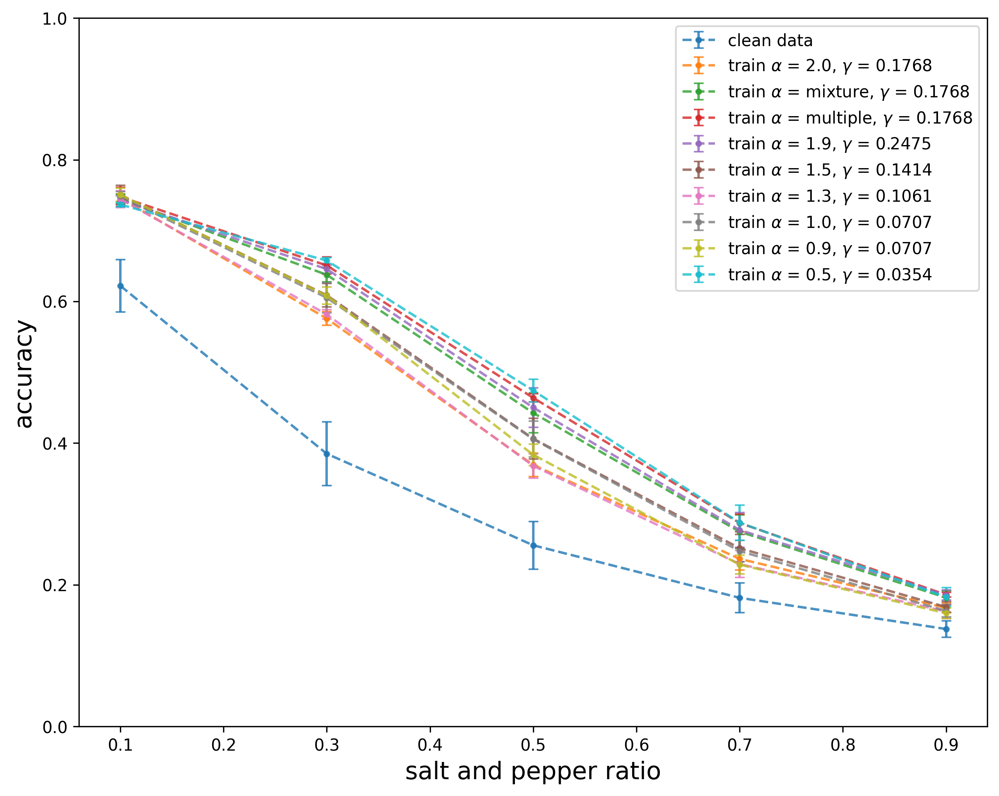

In [9]:
from matplotlib import pyplot
import seaborn as sns
opt_sigma={0.0: 0.1,
 2.0: 0.25,
 'multiple': 0.25,
 'mixture': 0.25,
 1.9: 0.35,
 1.5: 0.2,
 1.3: 0.15,
 1.0: 0.1,
 0.9: 0.1,
 0.5: 0.05}

ratio_list = [0.1, 0.3, 0.5, 0.7, 0.9]
for depth, width in [(3, 3), ]:
    print(depth, width)
    colors = sns.color_palette(n_colors = 10)
    # acc
    # plt.figure(dpi=300)
    alphas = [0.0,2.0,'mixture','multiple',1.9,1.5,1.3,1.0,0.9,0.5]
    plt.figure(figsize=(10, 8),dpi=300)
    i = 0
    mean_list = []
    for alpha in alphas:
        color=colors[i]
        sigma = 0.2
        acc_path = f"../results/acc_FCN_width{width}_depth{depth}_b64_alpha{alpha}_sigma{sigma}_testonsp.txt"
        if os.path.exists(acc_path) == 0:
            print('no exists,', acc_path)
            continue
        f = open(acc_path, 'rb')
        try:
            acc = pickle.load(f)
        except:
            print("the file is empty, alpha={}".format(alpha))
            continue
        df = pd.DataFrame(acc)
        npdf = np.array(df)
        means = np.array(npdf.mean(axis=0).round(decimals=4))
        stds = np.array(npdf.std(axis=0).round(decimals=4))
        mean_list.append(means)
        x = ratio_list
        sigma_train = opt_sigma[alpha]
        if alpha == 0:
            labels = 'clean data'
        else:
            labels = 'train $\\alpha$ = {}, $\gamma$ = {:.4f}'.format(alpha, sigma_train*np.sqrt(0.5))
        plt.errorbar(x,means,yerr=stds,capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
        i=i+1
    plt.ylim(0,1)
    plt.legend()
    plt.xlabel("salt and pepper ratio",fontsize=15)#横坐标名字
    plt.ylabel("accuracy",fontsize=15)#纵坐标名字
    plt.savefig('./figure/mnist_sp.png')
    plt.show()

In [25]:
res = pd.DataFrame(mean_list, columns=ratio_list, index=alphas)
print(res)
res.to_csv('../results/csv/testonsp.csv')

             0.1     0.3     0.5     0.7     0.9
0.0       0.6221  0.3850  0.2558  0.1816  0.1376
2.0       0.7461  0.5759  0.3692  0.2366  0.1674
mixture   0.7447  0.6376  0.4426  0.2749  0.1819
multiple  0.7476  0.6508  0.4639  0.2873  0.1859
1.9       0.7430  0.6457  0.4502  0.2774  0.1856
1.5       0.7505  0.6088  0.4063  0.2516  0.1686
1.3       0.7444  0.5817  0.3679  0.2293  0.1623
1.0       0.7482  0.6052  0.4056  0.2476  0.1631
0.9       0.7507  0.6081  0.3835  0.2285  0.1599
0.5       0.7367  0.6577  0.4742  0.2877  0.1827
